In [127]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import pandas as pd
import numpy as np
import matplotlib.ticker as ticker
from sklearn import preprocessing
%matplotlib inline
import math
import random
!conda install -c anaconda seaborn -y
import seaborn as sns

import time


!conda install -c conda-forge folium=0.5.0 --yes
import folium
print('Folium installed and imported!')

from google.colab import drive
drive.mount('/content/drive')


/bin/bash: conda: command not found
/bin/bash: conda: command not found
Folium installed and imported!
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Loading the Data** 

## The geojson map of Seattle

In [ ]:
#Read the Seattle geojson data
import json
import requests

#GeoJSON file obtained from https://raw.githubusercontent.com/seattleio/seattle-boundaries-data/master/data/neighborhoods.geojson
!wget https://raw.githubusercontent.com/seattleio/seattle-boundaries-data/master/data/neighborhoods.geojson -O neighborhoods.geojson
geofile = 'neighborhoods.geojson'

with open(geofile) as json_file:
    geodata = json.load(json_file)

    
    
print("There are "+str(len(geodata['features']))+" districts in the Seattle area:")

--2020-11-21 14:17:59--  https://raw.githubusercontent.com/seattleio/seattle-boundaries-data/master/data/neighborhoods.geojson
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12494190 (12M) [text/plain]
Saving to: ‘neighborhoods.geojson’

neighborhoods.geojs 100%[===================>]  11.92M  37.8MB/s    in 0.3s    

2020-11-21 14:18:00 (37.8 MB/s) - ‘neighborhoods.geojson’ saved [12494190/12494190]

There are 175 districts in the Seattle area:


## The traffic accidents data collected by the Seattle Department of Transport

In [ ]:
#df = pd.read_csv('https://opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0.csv')

#df.to_pickle('df_fresh.pkl')

#df = pd.read_pickle('df_fresh.pkl')

#df = pd.read_pickle('df_with_datetime.pkl')

#df = pd.read_pickle('df_just_before_SV0.pkl')


# Dataframe completely clean of Nan and empty entries
#df = pd.read_pickle("clean_df.pkl")

# Dataframe with neighbourhoods:
df = pd.read_pickle('./drive/My Drive/processed_df.pkl')


print("Shape of the data frame: "+str(df.shape[0])+' x '+str(df.shape[1]))

Shape of the data frame: 198144 x 48


In [ ]:
df.dtypes   # neighbourhoods only after extracting the neighbourhoods

X                         float64
Y                         float64
OBJECTID                    int64
INCKEY                      int64
COLDETKEY                   int64
REPORTNO                   object
STATUS                     object
ADDRTYPE                   object
INTKEY                    float64
LOCATION                   object
EXCEPTRSNCODE              object
EXCEPTRSNDESC              object
SEVERITYCODE               object
SEVERITYDESC               object
COLLISIONTYPE              object
PERSONCOUNT                 int64
PEDCOUNT                    int64
PEDCYLCOUNT                 int64
VEHCOUNT                    int64
INJURIES                    int64
SERIOUSINJURIES             int64
FATALITIES                  int64
INCDATE                    object
INCDTTM            datetime64[ns]
JUNCTIONTYPE               object
SDOT_COLCODE              float64
SDOT_COLDESC               object
INATTENTIONIND              int64
UNDERINFL                   int64
WEATHER       

#Convert to date time object

In [ ]:
# columns with the day of the week, month, day of the month and year will be created also

switch = 0

if switch == 1:
  df['INCDTTM'] = pd.to_datetime(df['INCDTTM'])
  df['year'] = df['INCDTTM'].dt.year
  df['month'] = df['INCDTTM'].dt.month
  df['day'] = df['INCDTTM'].dt.day
  df['hour'] = df['INCDTTM'].dt.hour
  df['minute'] = df['INCDTTM'].dt.minute
  df['weekday'] = df['INCDTTM'].dt.weekday
  df['day_name'] = df['INCDTTM'].dt.day_name()
  df.to_pickle('df_with_datetime.pkl')



In [ ]:
df.dtypes

X                         float64
Y                         float64
OBJECTID                    int64
INCKEY                      int64
COLDETKEY                   int64
REPORTNO                   object
STATUS                     object
ADDRTYPE                   object
INTKEY                    float64
LOCATION                   object
EXCEPTRSNCODE              object
EXCEPTRSNDESC              object
SEVERITYCODE               object
SEVERITYDESC               object
COLLISIONTYPE              object
PERSONCOUNT                 int64
PEDCOUNT                    int64
PEDCYLCOUNT                 int64
VEHCOUNT                    int64
INJURIES                    int64
SERIOUSINJURIES             int64
FATALITIES                  int64
INCDATE                    object
INCDTTM            datetime64[ns]
JUNCTIONTYPE               object
SDOT_COLCODE              float64
SDOT_COLDESC               object
INATTENTIONIND             object
UNDERINFL                  object
WEATHER       

In [ ]:
df.head(3)

,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,EXCEPTRSNCODE,EXCEPTRSNDESC,SEVERITYCODE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDATE,INCDTTM,JUNCTIONTYPE,SDOT_COLCODE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR,year,month,day,hour,minute,weekday,day_name
0,-122.356511,47.517361,1,327920,329420,3856094,Matched,Intersection,34911.0,17TH AVE SW AND SW ROXBURY ST,,NaN,1,Property Damage Only Collision,Angles,2,0,0,2,0,0,0,2020/01/19 00:00:00+00,2020-01-19 09:01:00,At Intersection (intersection related),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",NaN,N,Clear,Dry,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N,2020,1,19,9,1,6,Sunday
1,-122.361405,47.702064,2,46200,46200,1791736,Matched,Block,NaN,HOLMAN RD NW BETWEEN 4TH AVE NW AND 3RD AVE NW,NaN,NaN,1,Property Damage Only Collision,Rear Ended,2,0,0,2,0,0,0,2005/04/11 00:00:00+00,2005-04-11 18:31:00,Mid-Block (not related to intersection),14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",Y,0,Raining,Wet,Dusk,NaN,5101020.0,NaN,13,From same direction - both going straight - bo...,0,0,N,2005,4,11,18,31,0,Monday
2,-122.317414,47.664028,3,1212,1212,3507861,Matched,Block,NaN,ROOSEVELT WAY NE BETWEEN NE 47TH ST AND NE 50T...,,NaN,2,Injury Collision,Head On,2,0,0,2,1,0,0,2013/03/31 00:00:00+00,2013-03-31 02:09:00,Mid-Block (not related to intersection),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",NaN,N,Clear,Dry,Dark - Street Lights On,NaN,NaN,NaN,30,From opposite direction - all others,0,0,N,2013,3,31,2,9,6,Sunday


#**Data Cleaning**

Let´s see how many rows are missing

In [ ]:
#Check where there are NaNs in the dataframe
print(df.isnull().sum(axis=0))

X                    7478
Y                    7478
OBJECTID                0
INCKEY                  0
COLDETKEY               0
REPORTNO                0
STATUS                  0
ADDRTYPE             3714
INTKEY             149711
LOCATION             4593
EXCEPTRSNCODE      120403
EXCEPTRSNDESC      209953
SEVERITYCODE            1
SEVERITYDESC            0
COLLISIONTYPE       26451
PERSONCOUNT             0
PEDCOUNT                0
PEDCYLCOUNT             0
VEHCOUNT                0
INJURIES                0
SERIOUSINJURIES         0
FATALITIES              0
INCDATE                 0
INCDTTM                 0
JUNCTIONTYPE        11979
SDOT_COLCODE            1
SDOT_COLDESC            1
INATTENTIONIND     191550
UNDERINFL           26431
WEATHER             26641
ROADCOND            26560
LIGHTCOND           26730
PEDROWNOTGRNT      216543
SDOTCOLNUM          94533
SPEEDING           211802
ST_COLCODE           9413
ST_COLDESC          26451
SEGLANEKEY              0
CROSSWALKKEY

Let´s see how distributed is the missing data in the case of the WEATHER feature: 

In [ ]:
aux = df.groupby(['SEVERITYCODE'])['WEATHER'].value_counts(normalize=False,dropna = False, sort = True, ascending = True)
aux

SEVERITYCODE  WEATHER                 
0             Clear                           1
              Raining                         1
              NaN                         21654
1             Partly Cloudy                   5
              Severe Crosswind               18
              Blowing Sand/Dirt              41
              Sleet/Hail/Freezing Rain       85
              Fog/Smog/Smoke                383
              Other                         730
              Snowing                       738
              NaN                          3921
              Unknown                     14275
              Overcast                    19203
              Raining                     22172
              Clear                       76205
2             Partly Cloudy                   4
              Severe Crosswind                7
              Blowing Sand/Dirt              15
              Sleet/Hail/Freezing Rain       29
              Other                         120
 

Most of the missing data is concentrated in the SEVERITYCODE = 0. The same can be seen about the UNDERINFL feature and others: 

In [ ]:
aux = df.groupby(['SEVERITYCODE'])['UNDERINFL'].value_counts(normalize=False,dropna = False, sort = True, ascending = True)
aux

SEVERITYCODE  UNDERINFL
0             N                1
              NaN          21655
1             1             2372
              Y             3190
              NaN           3774
              0            57691
              N            70749
2             NaN            944
              1             1623
              Y             1939
              0            22701
              N            31635
2b            NaN             45
              1              184
              Y              228
              0             1185
              N             1469
3             NaN             13
              Y               42
              1               51
              0               99
              N              147
Name: UNDERINFL, dtype: int64

In [ ]:
df.replace("?", np.nan, inplace = True) # Substituting the unknown entries for Nan

print("Shape of the data frame without any drop: "+str(df.shape[0])+' x '+str(df.shape[1]))

# simply drop whole row with NaN in "ADDRTYPE" column
df.dropna(subset=["ADDRTYPE"], axis=0, inplace=True)

print("After the drop of the missing ADDRTYPE, the shape of the data frame is now "+str(df.shape[0])+' x '+str(df.shape[1]))

# simply drop whole row with NaN in "LOCATION" column
df.dropna(subset=["LOCATION"], axis=0, inplace=True)

print("After the drop of the missing LOCATION, the shape of the data frame is now "+str(df.shape[0])+' x '+str(df.shape[1]))

# simply drop whole row with NaN in "X, Y" columns
df.dropna(subset=["X","Y"], axis=0, inplace=True)

print("After the drop of the missing (X,Y) coordinates, the shape of the data frame is now "+str(df.shape[0])+' x '+str(df.shape[1]))

# reset index, because we droped rows
df.reset_index(drop=True, inplace=True)





Shape of the data frame without any drop: 221738 x 47
After the drop of the missing ADDRTYPE, the shape of the data frame is now 218024 x 47
After the drop of the missing LOCATION, the shape of the data frame is now 217145 x 47
After the drop of the missing (X,Y) coordinates, the shape of the data frame is now 214260 x 47


##The rows with SEVERITYCODE greater than 0 and with one of the above features missing will be simply dropped: 

In [ ]:
# Conditional drop with SEVERITYCDODE > 0: 
type(df)
aux = df.shape[0]
tic = time.time()
print("Begining with ",aux," rows")

df = df.drop(df[   (df["SEVERITYCODE"]!='0')  &  
                (    (pd.isnull(df["WEATHER"])==True ) 
                          | (pd.isnull(df["COLLISIONTYPE"])==True)
                          | (pd.isnull(df["ROADCOND"])==True) 
                          | (pd.isnull(df["ST_COLCODE"])==True)
                          | (pd.isnull(df["LIGHTCOND"])==True)
                          | (pd.isnull(df["ADDRTYPE"])==True)   
                          | (pd.isnull(df["UNDERINFL"])==True)                   
                          )].index)
tac = time.time()

# reset index, because we droped rows
df.reset_index(drop = True, inplace=True)
print("Ending with the shape: ", df.shape, "\n", "Time it´s taken: ",
      round(tac-tic,3),"s")

df.to_pickle('df_just_before_SV0.pkl')

Begining with  209146  rows
Ending with the shape:  (209146, 47) 
 Time it´s taken:  0.163 s


## **About the cases with SEVERITYCODE = 0**

It apparently happens that when the severity of the road accident is the lowest, the police officer does not care to note precisely all the features. 

Thus, one might estipulate that:

1.   a totally arbitrary distribution of missing features for WEATHER, and
2.   substitute nan-Nan-NaN for "No" (this applies for all others SEVERITYCODEs).


In [ ]:
# Let´s see the weather distribution: 

df["WEATHER"].value_counts(normalize=False,sort = True, dropna = False)    

Clear                       112433
Raining                      32864
Overcast                     27927
NaN                          19585
Unknown                      13884
Snowing                        900
Other                          793
Fog/Smog/Smoke                 561
Sleet/Hail/Freezing Rain       115
Blowing Sand/Dirt               49
Severe Crosswind                25
Partly Cloudy                   10
Name: WEATHER, dtype: int64

We will reproduce this distribution on the missing values for WEATHER in which SEVERITYCODE = 0: 

In [ ]:
# First, collecting the probability distribution into a Numpy array

aux = pd.DataFrame(df["WEATHER"].value_counts(normalize=True,sort = True)) 

prob_list = np.sort(np.array(aux['WEATHER']))[::-1].tolist() # The probabilities

# Observe that the Numpy array is converted into a list

weather_names = np.array(aux.index).tolist() # The options of weather 

print("The types of weather: \n" + str(weather_names) + "\n Their probabilities respectively: \n"  + str(prob_list))

The types of weather: 
['Clear', 'Raining', 'Overcast', 'Unknown', 'Snowing', 'Other', 'Fog/Smog/Smoke', 'Sleet/Hail/Freezing Rain', 'Blowing Sand/Dirt', 'Severe Crosswind', 'Partly Cloudy']
 Their probabilities respectively: 
[0.5931230580129879, 0.17336899467717515, 0.14732460790985488, 0.07324291389051546, 0.004747812049946983, 0.004183349950675508, 0.002959469511133619, 0.0006066648730487811, 0.0002584919893860024, 0.00013188366805408285, 5.275346722163314e-05]


In [ ]:

# Second, a function which will return a WEATHER value accordingly to
# this probability distribution 

def give_weather(): # This function will return a value to the WEATHER 

  chosen = random.choices(weather_names, weights = prob_list, k = 1)[0]

  return chosen




The same will be followed about the features  ST_COLCODE, LIGHTCOND, and COLLISIONTYPE. 

In [ ]:
# ST_COLCODE: 

# There are empty  string entries in ST_COLCODE
df = df.drop(df[df["ST_COLCODE"]==' '].index)
df.reset_index()

aux = pd.DataFrame(df["ST_COLCODE"].value_counts(normalize=True,sort = True)) 

prob_list2 = np.sort(np.array(aux['ST_COLCODE']))[::-1].tolist() # The probabilities

ST_COLCODE_names = np.array(aux.index).tolist() # The options of ST_COLCODE

def give_ST_COLCODE(): # This function will return a value to the ST_COLCODE

  chosen = random.choices(ST_COLCODE_names, weights = prob_list2, k = 1)[0]

  return chosen

# --------------------------------------------------------#

# LIGHTCOND: 
aux = pd.DataFrame(df["LIGHTCOND"].value_counts(normalize=True,sort = True)) 

prob_list3 = np.sort(np.array(aux['LIGHTCOND']))[::-1].tolist() # The probabilities

LIGHTCOND_names = np.array(aux.index).tolist() # The options of LIGHTCOND

def give_LIGHTCOND(): # This function will return a value to the LIGHTCOND

  chosen = random.choices(LIGHTCOND_names, weights = prob_list3, k = 1)[0]

  return chosen

# --------------------------------------------------------#

# COLLISIONTYPE: 
aux = pd.DataFrame(df["COLLISIONTYPE"].value_counts(normalize=True,sort = True)) 

prob_list4 = np.sort(np.array(aux['COLLISIONTYPE']))[::-1].tolist() # The probabilities

COLLISIONTYPE_names = np.array(aux.index).tolist() # The options of COLLISIONTYPE

def give_COLLISIONTYPE(): # This function will return a value to the COLLISIONTYPE

  chosen = random.choices(COLLISIONTYPE_names, weights = prob_list4, k = 1)[0]

  return chosen

# --------------------------------------------------------#

# ROADCOND: 
aux = pd.DataFrame(df["ROADCOND"].value_counts(normalize=True,sort = True)) 

prob_list5 = np.sort(np.array(aux['ROADCOND']))[::-1].tolist() # The probabilities

ROADCOND_names = np.array(aux.index).tolist() # The options of ROADCOND

def give_ROADCOND(): # This function will return a value to the ROADCOND

  chosen = random.choices(ROADCOND_names, weights = prob_list5, k = 1)[0]

  return chosen

# --------------------------------------------------------#

Finally, we assign the missing data with their statistical distributions:

In [ ]:
# WEATHER ------------------------------------------------

df.loc[(df['SEVERITYCODE'] == '0') & (pd.isnull(df["WEATHER"])==True), \
       'WEATHER'] = give_weather()
df["WEATHER"].value_counts(normalize=False,dropna = False, sort = True, 
                           ascending = True)
aux1 = df.groupby(['SEVERITYCODE'])['WEATHER'].value_counts(
    normalize=False,dropna = False, sort = True, ascending = True)

# --------------------------------------------------------#

# ST_COLCODE ------------------------------------------------

df.loc[(df['SEVERITYCODE'] == '0') & (pd.isnull(df["ST_COLCODE"])==True \
       ),'ST_COLCODE'] = give_ST_COLCODE()
df["ST_COLCODE"].value_counts(normalize=False,dropna = False, sort = True, 
                           ascending = True)
aux2 = df.groupby(['SEVERITYCODE'])['ST_COLCODE'].value_counts(
    normalize=False,dropna = False, sort = True, ascending = True)


# --------------------------------------------------------#

# LIGHTCOND ------------------------------------------------

df.loc[(df['SEVERITYCODE'] == '0') & (pd.isnull(df["LIGHTCOND"])==True), \
       'LIGHTCOND'] = give_LIGHTCOND()
df["LIGHTCOND"].value_counts(normalize=False,dropna = False, sort = True, 
                           ascending = True)
aux3 = df.groupby(['SEVERITYCODE'])['LIGHTCOND'].value_counts(
    normalize=False,dropna = False, sort = True, ascending = True)


# --------------------------------------------------------#

# COLLISIONTYPE ------------------------------------------------

df.loc[(df['SEVERITYCODE'] == '0') & (pd.isnull(df["COLLISIONTYPE"])==True), 
       'COLLISIONTYPE'] = give_COLLISIONTYPE()
df["COLLISIONTYPE"].value_counts(normalize=False,dropna = False, sort = True, 
                           ascending = True)
aux4 = df.groupby(['SEVERITYCODE'])['COLLISIONTYPE'].value_counts(
    normalize=False,dropna = False, sort = True, ascending = True)


# --------------------------------------------------------#

# ROADCOND ------------------------------------------------

df.loc[(df['SEVERITYCODE'] == '0') & (pd.isnull(df["ROADCOND"])==True), 
       'ROADCOND'] = give_ROADCOND()

df["ROADCOND"].value_counts(normalize=False,dropna = False, sort = True, 
                           ascending = True)
aux5 = df.groupby(['SEVERITYCODE'])['ROADCOND'].value_counts(
    normalize=False,dropna = False, sort = True, ascending = True)


# --------------------------------------------------------#


print(str(aux1) + "\n" + str(aux2) + "\n" + str(aux3) + "\n" + str(aux4) + 
      "\n" + str(aux5))


SEVERITYCODE  WEATHER                 
0             Clear                           1
              Raining                         1
              Overcast                     8583
1             Partly Cloudy                   5
              Severe Crosswind               17
              Blowing Sand/Dirt              36
              Sleet/Hail/Freezing Rain       85
              Fog/Smog/Smoke                370
              Other                         669
              Snowing                       724
              Unknown                     13070
              Overcast                    18731
              Raining                     21332
              Clear                       74460
2             Partly Cloudy                   4
              Severe Crosswind                7
              Blowing Sand/Dirt              13
              Sleet/Hail/Freezing Rain       28
              Other                         114
              Snowing                       166
 

## Substituting the missing values of UNDERINFL, INATTENTIONIND, PEDROWNOTGRNT and SPEEDING 


In [ ]:
df.loc[df["INATTENTIONIND"] != 'Y',"INATTENTIONIND"] = 0
df.loc[df["INATTENTIONIND"] == 'Y',"INATTENTIONIND"] = 1
df["INATTENTIONIND"] = df["INATTENTIONIND"].astype('int')

aux1 = df["INATTENTIONIND"].value_counts(normalize=False,dropna = False,sort = True,\
                                  ascending = True)

df.loc[df["UNDERINFL"] != 'Y', "UNDERINFL"] = 0
df.loc[df["UNDERINFL"] == 'Y', "UNDERINFL"] = 1
df["UNDERINFL"] = df["UNDERINFL"].astype('int')

aux2 = df["UNDERINFL"].value_counts(normalize=False,dropna = False,sort = True,\
                                  ascending = True)

df.loc[df["SPEEDING"] != 'Y',"SPEEDING"] = 0
df.loc[df["SPEEDING"] == 'Y',"SPEEDING"] = 1
df["SPEEDING"] = df["SPEEDING"].astype('int')

aux3 = df["SPEEDING"].value_counts(normalize=False,dropna = False,sort = True,\
                                  ascending = True)

df.loc[df["PEDROWNOTGRNT"] != 'Y',"PEDROWNOTGRNT"] = 0
df.loc[df["PEDROWNOTGRNT"] == 'Y',"PEDROWNOTGRNT"] = 1
df["PEDROWNOTGRNT"] = df["PEDROWNOTGRNT"].astype('int')

aux4 = df["PEDROWNOTGRNT"].value_counts(normalize=False,dropna = False,sort = True,\
                                  ascending = True)

df.loc[df["HITPARKEDCAR"] != 'Y',"HITPARKEDCAR"] = 0
df.loc[df["HITPARKEDCAR"] == 'Y',"HITPARKEDCAR"] = 1
df["HITPARKEDCAR"] = df["HITPARKEDCAR"].astype('int')

aux5 = df["HITPARKEDCAR"].value_counts(normalize=False,dropna = False,sort = True,\
                                  ascending = True)




print(str(aux1) +"\n"+ str(aux2) + "\n" + str(aux3) +"\n" + str(aux4) + \
                                  "\n" + str(aux5))

In [ ]:
df.loc[df["ROADCOND"] == 'Unknown',"ROADCOND"] = 'Dry'

#### Now, there is no predictive feature with any missing value. 

In [ ]:
df.isnull().sum()

X                       0
Y                       0
OBJECTID                0
INCKEY                  0
COLDETKEY               0
REPORTNO                0
STATUS                  0
ADDRTYPE                0
INTKEY             129990
LOCATION                0
EXCEPTRSNCODE      117931
EXCEPTRSNDESC      195113
SEVERITYCODE            0
SEVERITYDESC            0
COLLISIONTYPE           0
PERSONCOUNT             0
PEDCOUNT                0
PEDCYLCOUNT             0
VEHCOUNT                0
INJURIES                0
SERIOUSINJURIES         0
FATALITIES              0
INCDATE                 0
INCDTTM                 0
JUNCTIONTYPE         5312
SDOT_COLCODE            1
SDOT_COLDESC            1
INATTENTIONIND          0
UNDERINFL               0
WEATHER                 0
ROADCOND                0
LIGHTCOND               0
PEDROWNOTGRNT           0
SDOTCOLNUM          75913
SPEEDING                0
ST_COLCODE              0
ST_COLDESC           8583
SEGLANEKEY              0
CROSSWALKKEY

In [ ]:
df.dtypes

X                         float64
Y                         float64
OBJECTID                    int64
INCKEY                      int64
COLDETKEY                   int64
REPORTNO                   object
STATUS                     object
ADDRTYPE                   object
INTKEY                    float64
LOCATION                   object
EXCEPTRSNCODE              object
EXCEPTRSNDESC              object
SEVERITYCODE               object
SEVERITYDESC               object
COLLISIONTYPE              object
PERSONCOUNT                 int64
PEDCOUNT                    int64
PEDCYLCOUNT                 int64
VEHCOUNT                    int64
INJURIES                    int64
SERIOUSINJURIES             int64
FATALITIES                  int64
INCDATE                    object
INCDTTM            datetime64[ns]
JUNCTIONTYPE               object
SDOT_COLCODE              float64
SDOT_COLDESC               object
INATTENTIONIND              int64
UNDERINFL                   int64
WEATHER       

In [ ]:
df['ST_COLCODE'] = df["ST_COLCODE"].astype('int')
df.to_pickle("clean_df.pkl")





# **Extracting the neighbourhoods** 

We will use the geojson file and the (X,Y) coordinates to discover the neighbourhoods

In [ ]:
#Convert latitude/longitude to point objects and find out which area they lie in
#The running of this code will take a while (more than 3 hours)  

!pip install tqdm
from tqdm.auto import tqdm, trange

import concurrent.futures
import multiprocessing

import concurrent.futures
import multiprocessing
num_processes = multiprocessing.cpu_count()

from shapely.geometry import shape, Point, Polygon
from shapely.ops import nearest_points
from time import strftime, gmtime
import random

    
def find_county(lon, lat):
    point = Point(lon, lat)
    found_nhood = 0
    '''Most accidents can be trivially located within a neighbourhood
       using the polygon.contains() function from shapely
    '''
    for i in range(0,len(geodata['features'])):
        polygon = shape(geodata['features'][i]['geometry'])
    if polygon.contains(point):
            nhood = geodata['features'][i]['properties']['name']
            found_nhood = 1
    if found_nhood == 0:
        '''Some accidents can't be located within neighbourhoods because
           they occur on major highways which mark neighbourhood boundaries:
           the "no man's land" problem. Let's deal with these by assigning
           them to the _nearest_ neighbourhood
        '''
        nhoods = []
        distances = np.zeros(len(geodata['features']))
        for i in range(0,len(geodata['features'])):
            polygon = shape(geodata['features'][i]['geometry'])
            distances[i] = point.distance(polygon)
            nhoods.append(geodata['features'][i]['properties']['name'])
            
        min_distance = np.where(distances == np.amin(distances)) 
        try:
            #Usually this finds the nearest district
            min_distance_index = int(min_distance[0])
        except:
            '''But sometimes the accident is exactly equidistant between
               two neighbourhood boundaries. In this case, choose one
               of the districts at random to avoid biasing the sample
            '''
            min_distance_index = int(random.choice(min_distance[0]))
        nhood = nhoods[min_distance_index]
        found_nhood = 1
        if found_nhood == 0:
            sys.exit("I'm sorry I can't do that Dave...")
    return nhood
    
start_time = time.time()


with concurrent.futures.ProcessPoolExecutor(num_processes) as pool:
    df["NEIGHBOURHOOD"] = list(tqdm(pool.map(find_county, df['X'], df['Y'], chunksize=10), total=df.shape[0]))
    
        
elapsed_time = time.time() - start_time
print("Multi-thread elapsed time: "+str(strftime("%H:%M:%S", gmtime(elapsed_time))))

#Saving the processed dataframe 
df.to_pickle('processed_df.pkl')


Multi-thread elapsed time: 01:00:24


Now the dataframe contains the neighbourhoods


In [ ]:
df.columns

Index(['X', 'Y', 'OBJECTID', 'INCKEY', 'COLDETKEY', 'REPORTNO', 'STATUS',
       'ADDRTYPE', 'INTKEY', 'LOCATION', 'EXCEPTRSNCODE', 'EXCEPTRSNDESC',
       'SEVERITYCODE', 'SEVERITYDESC', 'COLLISIONTYPE', 'PERSONCOUNT',
       'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INJURIES', 'SERIOUSINJURIES',
       'FATALITIES', 'INCDATE', 'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE',
       'SDOT_COLDESC', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND',
       'LIGHTCOND', 'PEDROWNOTGRNT', 'SDOTCOLNUM', 'SPEEDING', 'ST_COLCODE',
       'ST_COLDESC', 'SEGLANEKEY', 'CROSSWALKKEY', 'HITPARKEDCAR', 'year',
       'month', 'day', 'hour', 'minute', 'weekday', 'day_name',
       'NEIGHBOURHOOD'],
      dtype='object')

## The choroplethmap of the accidents

After we got the neighbourhoods, we plot them in the map according to their severity code averages. 

In [158]:
# df = the dataframe with the neighbourhoods in it. 
df = pd.read_pickle('./drive/My Drive/processed_df.pkl')
#df = SampledShuffled_dataframe(df)

del mean_severities_cyl

# Numerifying the SEVERITYCODE
df.loc[df["SEVERITYCODE"] == '0', 'SEV_NUMERIC'] = 0
df.loc[df["SEVERITYCODE"] == '1', 'SEV_NUMERIC'] = 0
df.loc[(df["SEVERITYCODE"] == '2')  & (df["SEVERITYCODE"] == '2b'), 'SEV_NUMERIC'] = 1
df.loc[(df["SEVERITYCODE"] == '3') , 'SEV_NUMERIC'] = 2

# The mean severities by neighbourhoods
mean_severities = pd.DataFrame(df.groupby(["NEIGHBOURHOOD"]).mean().SEV_NUMERIC)
mean_severities.reset_index(inplace=True)
#temp.rename(columns = {'NEIGHBOURHOOD':"COUNT"}, inplace=True)
mean_severities.rename(columns = {'index':"NEIGHBOURHOOD"}, inplace=True)
mean_severities.rename(columns = {'SEV_NUMERIC':"MEAN_SEVERITY"}, inplace=True)


# Counting how many accidents there are in each neighbourhood
accidents_per_nhood = pd.DataFrame(df["NEIGHBOURHOOD"].value_counts())
accidents_per_nhood.reset_index(inplace=True)
accidents_per_nhood.rename(columns = {'NEIGHBOURHOOD':"COUNT"}, inplace=True)
accidents_per_nhood.rename(columns = {'index':"NEIGHBOURHOOD"}, inplace=True)

# The accidents involving cyclists by neighbourhoods
df.loc[df["PEDCYLCOUNT"]!=0, "HAD_CYL"] = 1
aux=df.loc[(df["PEDCYLCOUNT"]!=0)]
mean_severities_cyl = pd.DataFrame(aux.groupby(["NEIGHBOURHOOD"]).mean().SEV_NUMERIC)
mean_severities_cyl.reset_index(inplace=True)
temp.rename(columns = {'NEIGHBOURHOOD':"COUNT"}, inplace=True)
mean_severities_cyl.rename(columns = {'index':"NEIGHBOURHOOD"}, inplace=True)
mean_severities_cyl.rename(columns = {'SEV_NUMERIC':"MEAN_SEVERITY"}, inplace=True)
mean_severities_cyl.dropna(subset=['MEAN_SEVERITY'], inplace=True)

# Now count how many accidents involving cyclists by neighbourhoods
# there are in each neighbourhood
accidents_per_nhood_cyl = pd.DataFrame(aux["NEIGHBOURHOOD"].value_counts())
accidents_per_nhood_cyl.reset_index(inplace=True)
accidents_per_nhood_cyl.rename(columns = {'NEIGHBOURHOOD':"COUNT"}, inplace=True)
accidents_per_nhood_cyl.rename(columns = {'index':"NEIGHBOURHOOD"}, inplace=True)


accidents_per_nhood_cyl.head(5)


,NEIGHBOURHOOD,COUNT
0,University District,443
1,Broadway,431
2,Central Business District,362
3,Belltown,322
4,South Lake Union,243


In [152]:
df = pd.read_pickle('./drive/My Drive/processed_df.pkl')
df.loc[df["PEDCYLCOUNT"]!=0, "HAD_CYL"] = 1
aux=df.loc[(df["PEDCYLCOUNT"]!=0)]
aux.head(3)

,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,EXCEPTRSNCODE,EXCEPTRSNDESC,SEVERITYCODE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDATE,INCDTTM,JUNCTIONTYPE,SDOT_COLCODE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR,year,month,day,hour,minute,weekday,day_name,NEIGHBOURHOOD,HAD_CYL
6,-122.338543,47.616874,7,322275,323775,E949282,Matched,Block,NaN,8TH AVE BETWEEN WESTLAKE AVE AND BLANCHARD ST,,NaN,1,Property Damage Only Collision,Cycles,3,0,1,1,0,0,0,2019/08/08 00:00:00+00,2019-08-08 08:57:00,Mid-Block (not related to intersection),18.0,"MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END A...",1,0,Overcast,Dry,Daylight,0,NaN,0,5,Vehicle Strikes Pedalcyclist,0,0,0,2019,8,8,8,57,3,Thursday,Belltown,1.0
11,-122.344896,47.717173,13,1003,1003,3503158,Matched,Block,NaN,AURORA AVE N BETWEEN N 117TH PL AND N 125TH ST,,NaN,2,Injury Collision,Cycles,2,0,1,1,1,0,0,2013/03/14 00:00:00+00,2013-03-14 17:30:00,Driveway Junction,18.0,"MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END A...",0,0,Clear,Dry,Daylight,1,NaN,0,45,Vehicle - Pedalcyclist,15057,0,0,2013,3,14,17,30,3,Thursday,Bitter Lake,1.0
14,-122.358250,47.732321,16,63600,63600,2188744,Matched,Intersection,35587.0,1ST AVE NW AND NW 143RD ST,NaN,NaN,2,Injury Collision,Cycles,2,0,1,1,1,0,0,2006/05/16 00:00:00+00,2006-05-16 06:30:00,At Intersection (intersection related),51.0,PEDALCYCLIST STRUCK MOTOR VEHICLE FRONT END AT...,0,0,Clear,Dry,Daylight,0,6136002.0,0,45,Vehicle - Pedalcyclist,0,0,0,2006,5,16,6,30,1,Tuesday,Broadview,1.0


### The choroplethmap of the neighbourhoods by their accident counts

In [54]:
import folium

#Get the median latitude and logitude and centre the map there
lon_med = data["X"].mean()
lat_med = data["Y"].mean()

print(lat_med)
print(lon_med)

seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
#seattle_map


print(folium.__version__)

#Now use the geojson data and create a choropleth map
threshold_scale = np.linspace(accidents_per_nhood['COUNT'].min(),
                              accidents_per_nhood['COUNT'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 

# generate choropleth map using the accident data
seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
seattle_map.choropleth(
    geo_data=geodata,
    data=accidents_per_nhood,
    columns=['NEIGHBOURHOOD', 'COUNT'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    #nan_fill_opacity=0.0,
    #nan_line_opacity=0.0,
    legend_name='N accidents per neighbourhood',
    reset=True
)

# display map
seattle_map

47.61985294792667
-122.33058764386915
0.8.3


/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### The choroplethmap of the neighbourhoods by their mean severity

In [53]:
#Accident severity map
threshold_scale = np.linspace(mean_severities['MEAN_SEVERITY'].min(),
                              mean_severities['MEAN_SEVERITY'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 

#Generate a choropleth map of the mean accident severity in each neighbourhood
seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
seattle_map.choropleth(
    geo_data=geodata,
    data=mean_severities,
    columns=['NEIGHBOURHOOD', 'MEAN_SEVERITY'],
    key_on='feature.properties.name',
    #threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    nan_fill_opacity=0.0,
    nan_line_opacity=0.0,
    legend_name='Average severity code of accidents',
    reset=True
)

# display map
seattle_map

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### The accidents count involving cyclists in the neighbourhoods, considering the total of 5,944 accidents with cyclists





In [159]:
import folium

#Get the median latitude and logitude and centre the map there
lon_med = data["X"].mean()
lat_med = data["Y"].mean()

print(lat_med)
print(lon_med)

seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
#seattle_map


print(folium.__version__)

#Now use the geojson data and create a choropleth map
threshold_scale = np.linspace(accidents_per_nhood_cyl['COUNT'].min(),
                              accidents_per_nhood_cyl['COUNT'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 

# generate choropleth map using the accident data
seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
seattle_map.choropleth(
    geo_data=geodata,
    data=accidents_per_nhood_cyl,
    columns=['NEIGHBOURHOOD', 'COUNT'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    #nan_fill_opacity=0.0,
    #nan_line_opacity=0.0,
    legend_name='N accidents per neighbourhood',
    reset=True
)

# display map
seattle_map

47.61985294792667
-122.33058764386915
0.8.3


/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### The accident severity involving cyclists in the neighbourhoods, considering the total of 5,944 accidents

In [157]:
#Accident severity map
threshold_scale = np.linspace(mean_severities_cyl['MEAN_SEVERITY'].min(),
                              mean_severities_cyl['MEAN_SEVERITY'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 

#Generate a choropleth map of the mean accident severity in each neighbourhood
seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
seattle_map.choropleth(
    geo_data=geodata,
    data=mean_severities_cyl,
    columns=['NEIGHBOURHOOD', 'MEAN_SEVERITY'],
    key_on='feature.properties.name',
    #threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    nan_fill_opacity=0.0,
    nan_line_opacity=0.0,
    legend_name='Average severity code of accidents',
    reset=True
)

# display map
seattle_map

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [165]:
mean_severities.loc[mean_severities['MEAN_SEVERITY'] == mean_severities['MEAN_SEVERITY'].max()].NEIGHBOURHOOD

16    East Queen Anne
Name: NEIGHBOURHOOD, dtype: object

# **Data visualization and pre-processing: feature selection/extraction**


The histograms might disclose how much a feature influences the outcome of a accident, i.e., its seriousness represented by a severity code. 

In [ ]:
# This function creates rows with all possible target feature for each SEVERITYCODE

def Atleast_one_feat_each(target_feature):
  
    df = pd.read_pickle('./drive/My Drive/processed_df.pkl')

    #previous_shape = str(df.shape)

    a_row = pd.DataFrame(df.iloc[3456]).T.reset_index(drop=True)
    
    #start_time = time.time()
    for feature in [target_feature]:
      #print(feature)
        for possible_feature in df[feature].unique().tolist():
            for severity in ['0','1','2','2b','3']:
                a_row.loc[0,"SEVERITYCODE"] = severity
                a_row.loc[0,feature] = possible_feature
            #print(a_row.loc[0,feature])
                df = pd.concat([df,a_row], ignore_index=True)
    return df
#later_shape = str(df.shape)

#elapsed_time = time.time() - start_time
#print("Multi-thread elapsed time: ", elapsed_time)


#df.to_pickle('./drive/My Drive/post_processed_df.pkl')
#print("Previous shape of the df: "+previous_shape + "\n" + "Final shape of the df: " + later_shape)

In [ ]:
# Thisfunction returns dataframe of a feature grouped by the SEVERITYCODEs    
def GroupbySEVERITYCODE(feat,dataframe):

    norm = True
    sort = True

    df = dataframe

    aux = df.groupby(df['SEVERITYCODE'] == '0' )[feat].value_counts(normalize = norm, sort = sort, dropna = False).to_frame() 

    aux = pd.DataFrame(aux.loc[True][feat].to_frame())
    aux.rename(columns={feat:"Fraction"},inplace=True)
    aux_0 = aux.reset_index()


    aux = df.groupby(df['SEVERITYCODE'] == '1' )[feat].value_counts(normalize = norm, sort = sort, dropna = False).to_frame() 

    aux = pd.DataFrame(aux.loc[True][feat].to_frame())
    aux.rename(columns={feat:"Fraction"},inplace=True)
    aux_1 = aux.reset_index()


    aux = df.groupby(df['SEVERITYCODE'] == '2' )[feat].value_counts(normalize = norm, sort = sort, dropna = False).to_frame() 

    aux = pd.DataFrame(aux.loc[True][feat].to_frame())
    aux.rename(columns={feat:"Fraction"},inplace=True)
    aux_2 = aux.reset_index()


    aux = df.groupby(df['SEVERITYCODE'] == '2b' )[feat].value_counts(normalize = norm, sort = sort, dropna = False).to_frame() 

    aux = pd.DataFrame(aux.loc[True][feat].to_frame())
    aux.rename(columns={feat:"Fraction"},inplace=True)
    aux_2b = aux.reset_index()


    aux = df.groupby(df['SEVERITYCODE'] == '3' )[feat].value_counts(normalize = norm, sort = sort, dropna = False).to_frame() 

    aux = pd.DataFrame(aux.loc[True][feat].to_frame())
    aux.rename(columns={feat:"Fraction"},inplace=True)
    aux_3 = aux.reset_index()

    return aux_0, aux_1, aux_2, aux_2b, aux_3



Finally, we join all together into just one function which shall be used in a pratical manner. 

In [ ]:
# This function makes a histogram of a feature grouped by the SEVERITYCODE 
# In the case feature=NEIGHBOUHOODS or ST_COLCODE, that is, a feature with many possible values, 
# one must adapt the sev_i and labels with the appropriate list slicing ([1:5]) 

 
def make_histogram(feature,size_of_the_figure):

    import matplotlib
    import matplotlib.pyplot as plt
    import numpy as np

    size = size_of_the_figure    
    df = Atleast_one_feat_each(feature)

    aux_0, aux_1, aux_2, aux_2b, aux_3 = GroupbySEVERITYCODE(feature,df)


    labels = tuple(aux_0[feature].unique())[1:20]
    sev_0 = aux_0["Fraction"].tolist()[1:20]
    sev_1 = aux_1["Fraction"].tolist()[1:20]
    sev_2 = aux_2["Fraction"].tolist()[1:20]
    sev_2b = aux_2b["Fraction"].tolist()[1:20]
    sev_3 = aux_3["Fraction"].tolist()[1:20]

        

    x = np.arange(len(labels))  # the label locations
    width = 0.1  # the width of the bars

    plt.rcParams["figure.figsize"] = (size,size)
    fig, ax = plt.subplots()
    rects0 = ax.bar(x - 2*width, sev_0, width, label='0')
    rects1 = ax.bar(x - width, sev_1, width, label='1')
    rects2 = ax.bar(x, sev_2, width, label='2')
    rects2b = ax.bar(x + 1*width, sev_2b, width, label='2b')
    rects3 = ax.bar(x + 2*width, sev_3, width, label='3')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Fraction')
    ax.set_title(str(feature)+' grouped by the SEVERITYCODE')
    plt.xticks(rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()


    def autolabel(rects):
        """Attach a text label above each bar in *rects*, displaying its height."""
        for rect in rects:
            height = rect.get_height()
            ax.annotate('{}'.format(height),
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')


    #autolabel(rects0)
    #autolabel(rects1)
    #autolabel(rects2)
    #autolabel(rects2b)
    #autolabel(rects3)
    fig.tight_layout()

    plt.show()

    plt.savefig('./'+feature+'.png', bbox_inches='tight')





Now we visualize the histogram of a given feature, e.g., "ROADCOND", the road condition: 

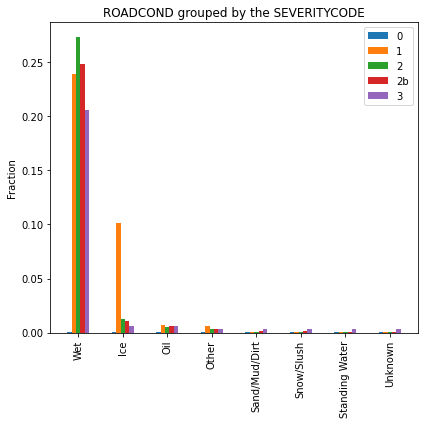

<Figure size 432x432 with 0 Axes>

In [ ]:
make_histogram("ROADCOND",6)

We see that there are almost none accident with severity code equal to zero in wet roads. Thus, we could assert that feature "ROADCOND" is "turned off" for SEVERITYCODE=0 when the condition is 'Wet'. We could proceed on doing the histogram of the LIGHTCOND: 

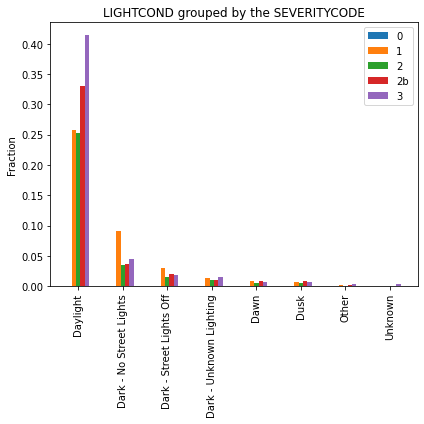

<Figure size 432x432 with 0 Axes>

In [ ]:
make_histogram("LIGHTCOND",6)

We can construct only the table also. For example: 

In [ ]:
df = pd.read_pickle('./drive/My Drive/processed_df.pkl')
aux_0, aux_1, aux_2, aux_2b, aux_3 = GroupbySEVERITYCODE("NEIGHBOURHOOD",df)
aux_3.head(10)

,NEIGHBOURHOOD,Fraction
0,Industrial District,0.096677
1,East Queen Anne,0.039275
2,Atlantic,0.036254
3,Columbia City,0.036254
4,Greenwood,0.036254
5,Belltown,0.033233
6,Rainier Beach,0.033233
7,Interbay,0.024169
8,Mid-Beacon Hill,0.024169
9,Pioneer Square,0.024169


Likewise with the RONDCOND, the severity codes are not equally distributed over all possible categorical values of ROADCOND. 
This can be confirmed by visualizying the heatmap of the correlations:  

In [ ]:
# This function makes a heatmap of a correlation matrix 

def Heatmap(target, feature,size):

  # target = the target feature (SEVERITYCODE generally)

  # feature = NEIGHBOOURHOOD etc 

  if feature == 'NEIGHBOURHOOD' or feature == 'ST_COLCODE':

    aux_0, aux_1, aux_2, aux_2b, aux_3 = GroupbySEVERITYCODE(feature,df)
    labels = aux_0[feature].unique().tolist()[1:20]
    aux_dummies = pd.get_dummies(df[feature])

    aux_df = df[[target]]
    aux_df = pd.concat([aux_df,pd.get_dummies(aux_dummies[labels])], axis=1) 
    aux_df = pd.concat([aux_df,pd.get_dummies(df[target])], axis=1)
  
  else:

    aux_df = df[[target]]
    aux_df = pd.concat([aux_df,pd.get_dummies(df[feature])], axis=1)
    aux_df = pd.concat([aux_df,pd.get_dummies(df[target])], axis=1)


  plt.rcParams["figure.figsize"] = (size,size)
  corr = aux_df.corr()
  plt.rc('xtick',labelsize=10)
  plt.rc('ytick',labelsize=10)
  sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, cmap="YlGnBu")

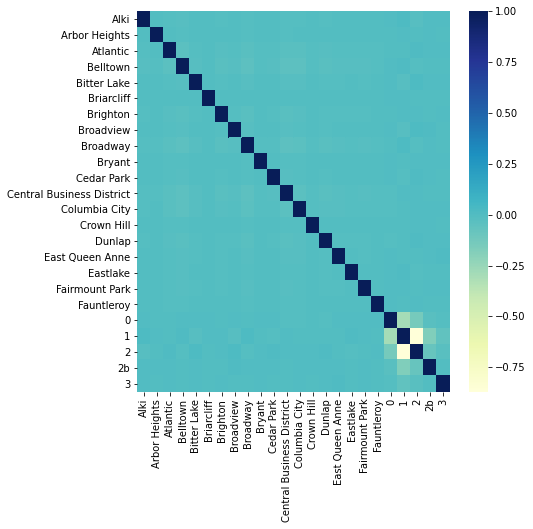

In [ ]:
Heatmap("SEVERITYCODE","NEIGHBOURHOOD", 7)

In agreement with the histogram, it can be seen that the correlation between SEVERITYCODE = 0 and 'Dark - Street Lights On' as pronounced above the average correlation, which around ~0.  

Having said that, I proposed the following **feature extractions**:

1.   Hand-picking the categorical values that are the most pronounced in a histogram for an certain SEVERITYCODE, based on a table produced by 

```
data_frame.groupby(["SEVERITYCODE"])["FEATURE"].valu_counts(sort = True, \
normalize = True),
```
such that the column FEATURE composed of categorical variables is translated into binary entries;

2.   instead of hand-picking, the Pearson Correlation Coefficient between categorical variable and SEVERITYCODE is the criteria, i.e., a binary value is assign to the categorical variable accordingly to its Pearson Coefficient in respect to the SEVERITYCODE, e.g.,

```
The LIGHTCOND entry for a certain row, such that its SEVERITYCODE is '1', 
is given by Heaviside( Pearson_coefficient(LIGHTCOND = 'Wet', SEVERITYCODE = '2') ), 
```
where Heaviside(x) is a function which returns 0 for $x<0$ and $1$ otherwise. 






The Heaviside function of $x$ around a threshold $x_{0}$ can be acessed by the code: 
```
Numpy.Heaviside(x,x0)
```
which will return the value of $H(x-x_{0})$.

### **Method 1 of Feature selection: Hand-picking**

In [ ]:
# Hand-picking - Data analysis     

def Data_analysis(df):

# COLLISIONTYPE

    df.loc[(df["SEVERITYCODE"]=='0') & (df["COLLISIONTYPE"]=='Angles'),"COLLISIONTYPE"] = 1 
    df.loc[(df["SEVERITYCODE"]=='0') & (df["COLLISIONTYPE"]!='Angles'), \
    "COLLISIONTYPE"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["COLLISIONTYPE"]=='Parked Car') \
    |(df["COLLISIONTYPE"]=='Angles') | (df["COLLISIONTYPE"]=='Rear Ended') \
    |(df["COLLISIONTYPE"]=='Other') | (df["COLLISIONTYPE"]=='Sideswipe')),\
    "COLLISIONTYPE"] = 1

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["COLLISIONTYPE"]!='Parked Car') \
    |(df["COLLISIONTYPE"]!='Angles')
    | (df["COLLISIONTYPE"]!='Rear Ended') \
    |(df["COLLISIONTYPE"]!='Other') | (df["COLLISIONTYPE"]!='Sideswipe')), \
    "COLLISIONTYPE"] = 0

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["COLLISIONTYPE"]=='Rear Ended')\
    |(df["COLLISIONTYPE"]=='Angles')), "COLLISIONTYPE"] = 1

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["COLLISIONTYPE"]!='Rear Ended') \
    |(df["COLLISIONTYPE"]!='Angles')), "COLLISIONTYPE"] = 0

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["COLLISIONTYPE"]=='Pedestrian') \
    |(df["COLLISIONTYPE"]=='Other') | (df["COLLISIONTYPE"]=='Angles') \
    |(df["COLLISIONTYPE"]=='Cycles')), "COLLISIONTYPE"] = 1

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["COLLISIONTYPE"]!='Pedestrian') \
    |(df["COLLISIONTYPE"]!='Other') | (df["COLLISIONTYPE"]!='Angles') \
    |(df["COLLISIONTYPE"]!='Cycles')), "COLLISIONTYPE"] = 0

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["COLLISIONTYPE"]=='Pedestrian') \
    |(df["COLLISIONTYPE"]=='Other')), "COLLISIONTYPE"] = 1

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["COLLISIONTYPE"]!='Pedestrian') \
    |(df["COLLISIONTYPE"]!='Other')), "COLLISIONTYPE"] = 0

    df["COLLISIONTYPE"] = df["COLLISIONTYPE"].astype(int) 

    #-------------------------------------------------------------------

    # LIGHTCOND

    df.loc[(df["SEVERITYCODE"]=='0') & \
    (df["LIGHTCOND"]=='Dark - Street Lights On'), "LIGHTCOND"] = 1

    df.loc[(df["SEVERITYCODE"]=='0') & \
    (df["LIGHTCOND"]!='Dark - Street Lights On'), "LIGHTCOND"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["LIGHTCOND"]=='Daylight')\
    | (df["LIGHTCOND"]=='Dark - Street Lights On')\
    | (df["LIGHTCOND"]=='Unknown')), "LIGHTCOND"] = 1 

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["LIGHTCOND"]!='Daylight')\
    | (df["LIGHTCOND"]!='Dark - Street Lights On')\
    | (df["LIGHTCOND"]!='Unknown')), "LIGHTCOND"] = 0 

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["LIGHTCOND"]=='Daylight')\
    | (df["LIGHTCOND"]=='Dark - Street Lights On')), "LIGHTCOND"] = 1 

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["LIGHTCOND"]!='Daylight')\
    | (df["LIGHTCOND"]!='Dark - Street Lights On')), "LIGHTCOND"] = 0 

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["LIGHTCOND"]=='Daylight')\
    | (df["LIGHTCOND"]=='Dark - Street Lights On')), "LIGHTCOND"] = 1 

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["LIGHTCOND"]!='Daylight')\
    | (df["LIGHTCOND"]!='Dark - Street Lights On')), "LIGHTCOND"] = 0 

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["LIGHTCOND"]=='Daylight')\
    | (df["LIGHTCOND"]=='Dark - Street Lights On')), "LIGHTCOND"] = 1 

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["LIGHTCOND"]!='Daylight')\
    | (df["LIGHTCOND"]!='Dark - Street Lights On')), "LIGHTCOND"] = 0 

    df["LIGHTCOND"] = df["LIGHTCOND"].astype(int) 

    #-------------------------------------------------------------------

    #ROADCOND

    df.loc[(df["SEVERITYCODE"]=='0') & (df["ROADCOND"]=='Dry'), "ROADCOND"] = 1 
    df.loc[(df["SEVERITYCODE"]=='0') & (df["ROADCOND"]!='Dry'), "ROADCOND"] = 0 

    for sev in ['1','2','2b','3']:
      df.loc[(df["SEVERITYCODE"]==sev) & ((df["ROADCOND"]=='Unknown') \
      | (df["ROADCOND"]=='Wet')), "ROADCOND"] = 1 
      df.loc[(df["SEVERITYCODE"]==sev) & ((df["ROADCOND"]!='Unknown') \
      | (df["ROADCOND"]!='Wet')), "ROADCOND"] = 0 
    df["ROADCOND"] = df["ROADCOND"].astype(int) 

    #-------------------------------------------------------------------

    # ST_COLCODE

    df.loc[(df["SEVERITYCODE"]=='0') & (df["ST_COLCODE"]==10), "ST_COLCODE"] = 1 
    df.loc[(df["SEVERITYCODE"]=='0') & (df["ST_COLCODE"]!=0), "ST_COLCODE"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["ST_COLCODE"]==32) \
    | (df["ST_COLCODE"]==10) | (df["ST_COLCODE"]==14) | (df["ST_COLCODE"]==11) \
    | (df["ST_COLCODE"]==50)), "ST_COLCODE"] = 1 
    df.loc[(df["SEVERITYCODE"]=='1') & ((df["ST_COLCODE"]!=32) \
    | (df["ST_COLCODE"]!=10) | (df["ST_COLCODE"]!=14) | (df["ST_COLCODE"]!=11) \
    | (df["ST_COLCODE"]!=50)), "ST_COLCODE"] = 0 

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["ST_COLCODE"]==10) \
    | (df["ST_COLCODE"]==14) ), "ST_COLCODE"] = 1 
    df.loc[(df["SEVERITYCODE"]=='2') & ((df["ST_COLCODE"]!=10) \
    | (df["ST_COLCODE"]!=14) ), "ST_COLCODE"] = 0

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["ST_COLCODE"]==0) \
    | (df["ST_COLCODE"]==10) | (df["ST_COLCODE"]==45) | (df["ST_COLCODE"]==50)\
    | (df["ST_COLCODE"]==28)), "ST_COLCODE"] = 1 

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["ST_COLCODE"]!=0) \
    | (df["ST_COLCODE"]!=10) | (df["ST_COLCODE"]!=45) | (df["ST_COLCODE"]!=50)\
    | (df["ST_COLCODE"]!=28)), "ST_COLCODE"] = 1 

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["ST_COLCODE"]==0)\
    | (df["ST_COLCODE"]==50)),"ST_COLCODE"] = 1 
    df.loc[(df["SEVERITYCODE"]=='3') & ((df["ST_COLCODE"]!=0) \
    | (df["ST_COLCODE"]!=50)),"ST_COLCODE"] = 0

    df["ST_COLCODE"] = df["ST_COLCODE"].astype(int)             

    #-------------------------------------------------------------------

    # day_name

    df.loc[(df["SEVERITYCODE"]=='0') & ((df["day_name"]=='Wednesday') \
    | (df["day_name"]=='Friday') | (df["day_name"]=='Thursday')\
    | (df["day_name"]=='Tuesday')), "day_name"] = 1 
    df.loc[(df["SEVERITYCODE"]=='0') & ((df["day_name"]!='Wednesday') \
    | (df["day_name"]!='Friday') | (df["day_name"]!='Thursday')\
    | (df["day_name"]!='Tuesday')), "day_name"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["day_name"]=='Wednesday') \
    | (df["day_name"]=='Friday') | (df["day_name"]=='Thursday')\
    | (df["day_name"]=='Tuesday')), "day_name"] = 1 
    df.loc[(df["SEVERITYCODE"]=='1') & ((df["day_name"]!='Wednesday') \
    | (df["day_name"]!='Friday') | (df["day_name"]!='Thursday')\
    | (df["day_name"]!='Tuesday')), "day_name"] = 0

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["day_name"]=='Wednesday') \
    | (df["day_name"]=='Friday') | (df["day_name"]=='Thursday')\
    | (df["day_name"]=='Tuesday')), "day_name"] = 1 
    df.loc[(df["SEVERITYCODE"]=='2') & ((df["day_name"]!='Wednesday') \
    | (df["day_name"]!='Friday') | (df["day_name"]!='Thursday')\
    | (df["day_name"]!='Tuesday')), "day_name"] = 0

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["day_name"]=='Friday')\
    | (df["day_name"]=='Thursday') | (df["day_name"]=='Tuesday')), "day_name"] = 1 
    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["day_name"]!='Friday')\
    | (df["day_name"]!='Thursday') | (df["day_name"]!='Tuesday')), "day_name"] = 0

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["day_name"]=='Friday')\
    | (df["day_name"]=='Wednesday')), "day_name"] = 1 
    df.loc[(df["SEVERITYCODE"]=='3') & ((df["day_name"]!='Friday')\
    | (df["day_name"]!='Wednesday')), "day_name"] = 0 

    df["day_name"] = df["day_name"].astype(int)  

    #-------------------------------------------------------------------

    # WEATHER

    df.loc[(df["SEVERITYCODE"]=='0') & (df["WEATHER"]=='Clear'), "WEATHER"] = 1
    df.loc[(df["SEVERITYCODE"]=='0') & (df["WEATHER"]!='Clear'), "WEATHER"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["WEATHER"]=='Clear')\
    | (df["WEATHER"]=='Raining') | (df["WEATHER"]=='Overcast')\
    | (df["WEATHER"]=='Unknown')), "WEATHER"] = 1                               
    df.loc[(df["SEVERITYCODE"]=='1') & ((df["WEATHER"]!='Clear')\
    | (df["WEATHER"]!='Raining') | (df["WEATHER"]!='Overcast')\
    | (df["WEATHER"]!='Unknown')), "WEATHER"] = 0 

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["WEATHER"]=='Clear')\
    | (df["WEATHER"]=='Raining') | (df["WEATHER"]=='Overcast')), "WEATHER"] = 1                               
    df.loc[(df["SEVERITYCODE"]=='2') & ((df["WEATHER"]!='Clear')\
    | (df["WEATHER"]!='Raining') | (df["WEATHER"]!='Overcast')), "WEATHER"] = 0 

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["WEATHER"]=='Clear') \
    | (df["WEATHER"]=='Raining') | (df["WEATHER"]=='Overcast') ), "WEATHER"] = 1                               
    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["WEATHER"]!='Clear') \
    | (df["WEATHER"]!='Raining') | (df["WEATHER"]!='Overcast') ), "WEATHER"] = 0 
      
    df.loc[(df["SEVERITYCODE"]=='3') & ((df["WEATHER"]=='Clear') \
    | (df["WEATHER"]=='Raining') | (df["WEATHER"]=='Overcast')) , "WEATHER"] = 1                               
    df.loc[(df["SEVERITYCODE"]=='3') & ((df["WEATHER"]!='Clear') \
    | (df["WEATHER"]!='Raining') | (df["WEATHER"]!='Overcast')), "WEATHER"] = 0 

    df["WEATHER"] = df["WEATHER"].astype(int)
    #-------------------------------------------------------------------

    # PERSONCOUNT 

    df.loc[(df["SEVERITYCODE"]=='0') & (df["PERSONCOUNT"]==0), "PERSONCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='0') & (df["PERSONCOUNT"]!=0), "PERSONCOUNT"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["PERSONCOUNT"]==2)\
    | (df["PERSONCOUNT"]==3)), "PERSONCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='1') & ((df["PERSONCOUNT"]!=2)\
    | (df["PERSONCOUNT"]!=3)), "PERSONCOUNT"] = 1 

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["PERSONCOUNT"]==2)\
    | (df["PERSONCOUNT"]==3) | (df["PERSONCOUNT"]==4)
    | (df["PERSONCOUNT"]==1)), "PERSONCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='2') & ((df["PERSONCOUNT"]!=2)\
    | (df["PERSONCOUNT"]!=3) | (df["PERSONCOUNT"]!=4)\
    | (df["PERSONCOUNT"]!=1)), "PERSONCOUNT"] = 0

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["PERSONCOUNT"]==2)\
    | (df["PERSONCOUNT"]==3) | (df["PERSONCOUNT"]==4)\
    | (df["PERSONCOUNT"]==1)), "PERSONCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["PERSONCOUNT"]!=2)\
    | (df["PERSONCOUNT"]!=3) | (df["PERSONCOUNT"]!=4)\
    | (df["PERSONCOUNT"]!=1)), "PERSONCOUNT"] = 0

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["PERSONCOUNT"]==2)\
    | (df["PERSONCOUNT"]==3) | (df["PERSONCOUNT"]==1)),"PERSONCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='3') & ((df["PERSONCOUNT"]!=2)\
    | (df["PERSONCOUNT"]!=3) | (df["PERSONCOUNT"]!=1)),"PERSONCOUNT"] = 0

    df["PERSONCOUNT"] = df["PERSONCOUNT"].astype(int)

    #-------------------------------------------------------------------

    # PEDCOUNT
    df.loc[(df["SEVERITYCODE"]=='0') & (df["PEDCOUNT"]==0), "PEDCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='0') & (df["PEDCOUNT"]>=1), "PEDCOUNT_1"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & (df["PEDCOUNT"]==0), "PEDCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='1') & (df["PEDCOUNT"]>=1), "PEDCOUNT_1"] = 0

    df.loc[(df["SEVERITYCODE"]=='2') & (df["PEDCOUNT"]==0), "PEDCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='2') & (df["PEDCOUNT"]>=1), "PEDCOUNT_1"] = 1

    df.loc[(df["SEVERITYCODE"]=='2b') & (df["PEDCOUNT"]==0), "PEDCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='2b')& (df["PEDCOUNT"]>=1), "PEDCOUNT_1"] = 1

    df.loc[(df["SEVERITYCODE"]=='3') & (df["PEDCOUNT"]==0), "PEDCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='3')& (df["PEDCOUNT"]>=1), "PEDCOUNT_1"] = 1

    #-------------------------------------------------------------------

    # PEDCYLCOUNT

    df.loc[(df["SEVERITYCODE"]=='0') & (df["PEDCYLCOUNT"]==0), "PEDCYLCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='0'), "PEDCYLCOUNT_1"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & (df["PEDCYLCOUNT"]==0), "PEDCYLCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='1') & (df["PEDCYLCOUNT"]>=0), "PEDCYLCOUNT_1"] = 0

    df.loc[(df["SEVERITYCODE"]=='2') & (df["PEDCYLCOUNT"]==0), "PEDCYLCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='2') & (df["PEDCYLCOUNT"]>=0), "PEDCYLCOUNT_1"] = 1

    df.loc[(df["SEVERITYCODE"]=='2b') & (df["PEDCYLCOUNT"]==0), "PEDCYLCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='2b') & (df["PEDCYLCOUNT"]>=0), "PEDCYLCOUNT_1"] = 1

    df.loc[(df["SEVERITYCODE"]=='3') & (df["PEDCYLCOUNT"]==0), "PEDCYLCOUNT_0"] = 1
    df.loc[(df["SEVERITYCODE"]=='3') & (df["PEDCYLCOUNT"]>=0), "PEDCYLCOUNT_1"] = 1

    #-------------------------------------------------------------------

    # VEHCOUNT

    df.loc[(df["SEVERITYCODE"]=='0') & (df["VEHCOUNT"]==0),"VEHCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='0') & (df["VEHCOUNT"]!=0),"VEHCOUNT"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["VEHCOUNT"]==2)\
    | (df["VEHCOUNT"]==1)| (df["VEHCOUNT"]==3)),"VEHCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='1') & ((df["VEHCOUNT"]!=2)\
    | (df["VEHCOUNT"]!=1)| (df["VEHCOUNT"]!=3)),"VEHCOUNT"] = 0

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["VEHCOUNT"]==2)\
    | (df["VEHCOUNT"]==1)| (df["VEHCOUNT"]==3)| (df["VEHCOUNT"]==4)),"VEHCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=="2") & ((df["VEHCOUNT"]!=2)\
    | (df["VEHCOUNT"]!=1)| (df["VEHCOUNT"]!=3)| (df["VEHCOUNT"]!=4)),"VEHCOUNT"] = 0

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["VEHCOUNT"]==1)\
    | (df["VEHCOUNT"]==2)| (df["VEHCOUNT"]==3)),"VEHCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["VEHCOUNT"]!=1)\
    | (df["VEHCOUNT"]!=2)| (df["VEHCOUNT"]!=3)),"VEHCOUNT"] = 0

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["VEHCOUNT"]==1)\
    | (df["VEHCOUNT"]==2)| (df["VEHCOUNT"]==3)),"VEHCOUNT"] = 1
    df.loc[(df["SEVERITYCODE"]=='3') & ((df["VEHCOUNT"]!=1)\
    | (df["VEHCOUNT"]!=2)| (df["VEHCOUNT"]!=3)),"VEHCOUNT"] = 0

    #-------------------------------------------------------------------

    # NEIGHBOURHOOD

    df.loc[(df["SEVERITYCODE"]=='0') & ((df["NEIGHBOURHOOD"]=='University District')\
    |(df["NEIGHBOURHOOD"]=='Belltown')|(df["NEIGHBOURHOOD"]=='Industrial District')\
    |(df["NEIGHBOURHOOD"]=='Broadway')|(df["NEIGHBOURHOOD"]=='Central Business District')\
    |(df["NEIGHBOURHOOD"]=='Fremont')|(df["NEIGHBOURHOOD"]=='Greenwood')\
    |(df["NEIGHBOURHOOD"]=='Wallingford')|(df["NEIGHBOURHOOD"]=='First Hill')\
    |(df["NEIGHBOURHOOD"]=='South Lake Union')\
    |(df["NEIGHBOURHOOD"]=='Lower Queen Anne')\
    |(df["NEIGHBOURHOOD"]=='Haller Lake')\
    |(df["NEIGHBOURHOOD"]=='Columbia City')\
    |(df["NEIGHBOURHOOD"]=='North Beacon Hill')),"NEIGHBOURHOOD"] = 1

    df.loc[(df["SEVERITYCODE"]=='0') & ((df["NEIGHBOURHOOD"]!='University District')\
    |(df["NEIGHBOURHOOD"]!='Belltown')|(df["NEIGHBOURHOOD"]!='Industrial District')\
    |(df["NEIGHBOURHOOD"]!='Broadway')|(df["NEIGHBOURHOOD"]!='Central Business District')\
    |(df["NEIGHBOURHOOD"]!='Fremont')|(df["NEIGHBOURHOOD"]!='Greenwood')\
    |(df["NEIGHBOURHOOD"]!='Wallingford')|(df["NEIGHBOURHOOD"]!='First Hill')\
    |(df["NEIGHBOURHOOD"]!='South Lake Union')\
    |(df["NEIGHBOURHOOD"]!='Lower Queen Anne')\
    |(df["NEIGHBOURHOOD"]!='Haller Lake')\
    |(df["NEIGHBOURHOOD"]!='Columbia City')\
    |(df["NEIGHBOURHOOD"]!='North Beacon Hill')),"NEIGHBOURHOOD"] = 0

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["NEIGHBOURHOOD"]=='Belltown')\
    |(df["NEIGHBOURHOOD"]=='Industrial District')|(df["NEIGHBOURHOOD"]=='University District')\
    |(df["NEIGHBOURHOOD"]=='Broadway')|(df["NEIGHBOURHOOD"]=='Central Business District')\
    |(df["NEIGHBOURHOOD"]=='Columbia City')|(df["NEIGHBOURHOOD"]=='Greenwood')\
    |(df["NEIGHBOURHOOD"]=='South Lake Union')|(df["NEIGHBOURHOOD"]=='North Beacon Hill')\
    |(df["NEIGHBOURHOOD"]=='Fremont')\
    |(df["NEIGHBOURHOOD"]=='Wallingford')\
    |(df["NEIGHBOURHOOD"]=='First Hill')\
    |(df["NEIGHBOURHOOD"]=='Georgetown')\
    |(df["NEIGHBOURHOOD"]=='Pioneer Square')\
    |(df["NEIGHBOURHOOD"]=='Atlantic')),"NEIGHBOURHOOD"] = 1

    df.loc[(df["SEVERITYCODE"]=='1') & ((df["NEIGHBOURHOOD"]!='Belltown')\
    |(df["NEIGHBOURHOOD"]!='Industrial District')|(df["NEIGHBOURHOOD"]!='University District')\
    |(df["NEIGHBOURHOOD"]!='Broadway')|(df["NEIGHBOURHOOD"]!='Central Business District')\
    |(df["NEIGHBOURHOOD"]!='Columbia City')|(df["NEIGHBOURHOOD"]!='Greenwood')\
    |(df["NEIGHBOURHOOD"]!='South Lake Union')|(df["NEIGHBOURHOOD"]!='North Beacon Hill')\
    |(df["NEIGHBOURHOOD"]!='Fremont')\
    |(df["NEIGHBOURHOOD"]!='Wallingford')\
    |(df["NEIGHBOURHOOD"]!='First Hill')\
    |(df["NEIGHBOURHOOD"]!='Georgetown')\
    |(df["NEIGHBOURHOOD"]!='Pioneer Square')\
    |(df["NEIGHBOURHOOD"]!='Atlantic')),"NEIGHBOURHOOD"] = 0

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["NEIGHBOURHOOD"]=='Industrial District')\
    |(df["NEIGHBOURHOOD"]=='Belltown')|(df["NEIGHBOURHOOD"]=='University District')\
    |(df["NEIGHBOURHOOD"]=='Broadway')|(df["NEIGHBOURHOOD"]=='Central Business District')\
    |(df["NEIGHBOURHOOD"]=='Columbia City')|(df["NEIGHBOURHOOD"]=='Greenwood')\
    |(df["NEIGHBOURHOOD"]=='South Lake Union')|(df["NEIGHBOURHOOD"]=='North Beacon Hill')\
    |(df["NEIGHBOURHOOD"]=='Haller Lake')\
    |(df["NEIGHBOURHOOD"]=='Wallingford')\
    |(df["NEIGHBOURHOOD"]=='Atlantic')\
    |(df["NEIGHBOURHOOD"]=='Pioneer Square')\
    |(df["NEIGHBOURHOOD"]=='First Hill')\
    |(df["NEIGHBOURHOOD"]=='Georgetown')\
    |(df["NEIGHBOURHOOD"]=='Fremont')),"NEIGHBOURHOOD"] = 1

    df.loc[(df["SEVERITYCODE"]=='2') & ((df["NEIGHBOURHOOD"]!='Industrial District')\
    |(df["NEIGHBOURHOOD"]!='Belltown')|(df["NEIGHBOURHOOD"]!='University District')\
    |(df["NEIGHBOURHOOD"]!='Broadway')|(df["NEIGHBOURHOOD"]!='Central Business District')\
    |(df["NEIGHBOURHOOD"]!='Columbia City')|(df["NEIGHBOURHOOD"]!='Greenwood')\
    |(df["NEIGHBOURHOOD"]!='South Lake Union')|(df["NEIGHBOURHOOD"]!='North Beacon Hill')\
    |(df["NEIGHBOURHOOD"]!='Haller Lake')\
    |(df["NEIGHBOURHOOD"]!='Wallingford')\
    |(df["NEIGHBOURHOOD"]!='Atlantic')\
    |(df["NEIGHBOURHOOD"]!='Pioneer Square')\
    |(df["NEIGHBOURHOOD"]!='First Hill')\
    |(df["NEIGHBOURHOOD"]!='Georgetown')\
    |(df["NEIGHBOURHOOD"]!='Fremont')),"NEIGHBOURHOOD"] = 0

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["NEIGHBOURHOOD"]=='Industrial District')\
    |(df["NEIGHBOURHOOD"]=='Belltown')|(df["NEIGHBOURHOOD"]=='University District')\
    |(df["NEIGHBOURHOOD"]=='Broadway')|(df["NEIGHBOURHOOD"]=='Central Business District')\
    |(df["NEIGHBOURHOOD"]=='Columbia City')|(df["NEIGHBOURHOOD"]=='Greenwood')\
    |(df["NEIGHBOURHOOD"]=='South Lake Union')\
    |(df["NEIGHBOURHOOD"]=='Wallingford')\
    |(df["NEIGHBOURHOOD"]=='Atlantic')\
    |(df["NEIGHBOURHOOD"]=='Pioneer Square')\
    |(df["NEIGHBOURHOOD"]=='First Hill')\
    |(df["NEIGHBOURHOOD"]=='Georgetown')),"NEIGHBOURHOOD"] = 1

    df.loc[(df["SEVERITYCODE"]=='2b') & ((df["NEIGHBOURHOOD"]!='Industrial District')\
    |(df["NEIGHBOURHOOD"]!='Belltown')|(df["NEIGHBOURHOOD"]!='University District')\
    |(df["NEIGHBOURHOOD"]!='Broadway')|(df["NEIGHBOURHOOD"]!='Central Business District')\
    |(df["NEIGHBOURHOOD"]!='Columbia City')|(df["NEIGHBOURHOOD"]!='Greenwood')\
    |(df["NEIGHBOURHOOD"]!='South Lake Union')\
    |(df["NEIGHBOURHOOD"]!='Wallingford')\
    |(df["NEIGHBOURHOOD"]!='Atlantic')\
    |(df["NEIGHBOURHOOD"]!='Pioneer Square')\
    |(df["NEIGHBOURHOOD"]!='First Hill')\
    |(df["NEIGHBOURHOOD"]!='Georgetown')),"NEIGHBOURHOOD"] = 0

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["NEIGHBOURHOOD"]=='Industrial District')\
    |(df["NEIGHBOURHOOD"]=='East Queen Anne')|(df["NEIGHBOURHOOD"]=='University District')\
    |(df["NEIGHBOURHOOD"]=='Broadway')|(df["NEIGHBOURHOOD"]=='Central Business District')\
    |(df["NEIGHBOURHOOD"]=='Columbia City')|(df["NEIGHBOURHOOD"]=='Greenwood')\
    |(df["NEIGHBOURHOOD"]=='Belltown')\
    |(df["NEIGHBOURHOOD"]=='Rainier Beach	')\
    |(df["NEIGHBOURHOOD"]=='Interbay')\
    |(df["NEIGHBOURHOOD"]=='Atlantic')\
    |(df["NEIGHBOURHOOD"]=='Mid-Beacon Hill')\
    |(df["NEIGHBOURHOOD"]=='Pioneer Square')\
    |(df["NEIGHBOURHOOD"]=='Georgetown')\
    |(df["NEIGHBOURHOOD"]=='Maple Leaf')\
    |(df["NEIGHBOURHOOD"]=='Brighton')\
    |(df["NEIGHBOURHOOD"]=='Broadway')\
    |(df["NEIGHBOURHOOD"]=='First Hill')\
    |(df["NEIGHBOURHOOD"]=='Green Lake')\
    |(df["NEIGHBOURHOOD"]=='Roosevelt')),"NEIGHBOURHOOD"] = 1

    df.loc[(df["SEVERITYCODE"]=='3') & ((df["NEIGHBOURHOOD"]!='Industrial District')\
    |(df["NEIGHBOURHOOD"]!='East Queen Anne')|(df["NEIGHBOURHOOD"]!='University District')\
    |(df["NEIGHBOURHOOD"]!='Broadway')|(df["NEIGHBOURHOOD"]!='Central Business District')\
    |(df["NEIGHBOURHOOD"]!='Columbia City')|(df["NEIGHBOURHOOD"]!='Greenwood')\
    |(df["NEIGHBOURHOOD"]!='Belltown')\
    |(df["NEIGHBOURHOOD"]!='Rainier Beach	')\
    |(df["NEIGHBOURHOOD"]!='Interbay')\
    |(df["NEIGHBOURHOOD"]!='Atlantic')\
    |(df["NEIGHBOURHOOD"]!='Mid-Beacon Hill')\
    |(df["NEIGHBOURHOOD"]!='Pioneer Square')\
    |(df["NEIGHBOURHOOD"]!='Georgetown')\
    |(df["NEIGHBOURHOOD"]!='Maple Leaf')\
    |(df["NEIGHBOURHOOD"]!='Brighton')\
    |(df["NEIGHBOURHOOD"]!='Broadway')\
    |(df["NEIGHBOURHOOD"]!='First Hill')\
    |(df["NEIGHBOURHOOD"]!='Green Lake')\
    |(df["NEIGHBOURHOOD"]!='Roosevelt')),"NEIGHBOURHOOD"] = 0

    df["NEIGHBOURHOOD"] = df["NEIGHBOURHOOD"].astype(int)

    #-------------------------------------------------------------------

    # Finally, we get dummy variables for ADDRTYPE

    df["ADDRTYPE"] = pd.get_dummies(df["ADDRTYPE"])

    return df 


### **Method 2: Feature Selection: the Pearson Correlation Coefficient**

As said before, instead of embeding the threshold values by hand, we could resort to the calculation of the Pearson Correlation Coefficient of a given variable, say it, 'Daylight' (from LIGHTCOND) vs '1' (from SEVERITYCODE). Thus, we would classify all categorical variables into binaries according to their correlation to the target feature, the severity of the accident. 

In [ ]:
# This function returns a DataFrame with column features activated by theirs Pearson Correlation Coeficient 
# with the severity codes - (activated by a Heaviside)


def Activations_by_Correlation(data_frame,feature):
  
  
  df2 = data_frame
  #df2 = pd.read_pickle('./drive/My Drive/processed_df.pkl')
  #df2["SEVERITYCODE"] = "SC "+df2["SEVERITYCODE"]
  values_SEVERITYCODE = tuple(df2["SEVERITYCODE"].unique().tolist())
  aux_df = df2[["SEVERITYCODE"]]

  aux_df = pd.concat([aux_df,pd.get_dummies(df2["SEVERITYCODE"])], axis=1)

                 
  aux_df = pd.concat([aux_df,pd.get_dummies(df2[feature])], axis=1)
  all_categories = tuple(df2[feature].unique().tolist())
  print("all_categories: ", all_categories)



  features_correlation = values_SEVERITYCODE + all_categories

  correlations = aux_df[list(features_correlation)].corr()



  for category in (df2[feature].unique().tolist()):
        
      for alpha in aux_df["SEVERITYCODE"].unique().tolist(): 
        #print(alpha + " vs " + category)
        correlated_value = np.heaviside(correlations[category][alpha],1)
        #print("correlated_value: ", correlated_value)        

        df2.loc[(df2["SEVERITYCODE"]== alpha) & (df2[feature]==category),\
        feature] = correlated_value
     
  return df2[[feature]] 


In [ ]:
def Pearson_Correlation(data_frame, list_of_features):

#  list_of_features = ["COLLISIONTYPE","LIGHTCOND","ROADCOND","ST_COLCODE",\
#  "day_name","WEATHER","PERSONCOUNT","PEDCOUNT","PEDCYLCOUNT","VEHCOUNT",\
#  "NEIGHBOURHOOD"]

  #list_of_features = ["COLLISIONTYPE","ROADCOND"]
  df = pd.DataFrame()
  for feature in list_of_features:
    df = pd.concat([Activations_by_Correlation(data_frame,feature),df],axis=1)

  return df

  #df.groupby(["SEVERITYCODE"])["COLLISIONTYPE"].value_counts()

### **Method 3: Feature selection: Chi-Squared**


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.metrics import accuracy_score


In [ ]:
def chi_squared(data_frame, target_data_frame, k_squares): 
  
    X = data_frame.values
    y = target_data_frame.values
    
    X = X.astype(str)
    y = y.astype(str)
    

    # prepare input data
    oe = OrdinalEncoder()
    oe.fit(X)  
    X = oe.transform(X)

    # split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
    print("split into train and test sets - OKAY")
       

    # prepare target
    le = LabelEncoder()
    oe.fit(y_train)
    y_train_enc = oe.transform(y_train)
    y_test_enc = oe.transform(y_test)
    

    fs = SelectKBest(score_func=chi2, k=k_squares)
    fs.fit(X_train, y_train)
    X_train_fs = fs.transform(X_train)
    X_test_fs = fs.transform(X_test)
    
    # what are scores for the features
    for i in range(k_squares):
      print('Feature %d: %f' % (i, fs.scores_[i]))
    # plot the scores
    plt.bar([i for i in range(k_squares)], fs.scores_)
    plt.show()

    return X_train_fs, X_test_fs, y_train_enc, y_test_enc




    

# **Balancing the dataset**

It happens that the cases in which the SEVERITYCODE = 0 surmount in number the whole dataset. Consequently, any machine learning training will be biased prediticting accidents with sEVERITYCODE '0' all the time, with 1.0 of accuracy on the test set.

Therefore, the dataset with an equal number of SEVERITYCODE cases - '0', '1', '2', '2b', and '3' - will be used in the machine learning.

The minority of cases is in which SEVERITYCODE = '3', thus its size will characterize the size of the others cases.



In [ ]:
# This code is based on the Aldair P. Thomson´s code found here: 

# It will return a resampled and shuffled dataframe

from sklearn.utils import resample

def SampledShuffled_dataframe(X):

    # Re-sample the dataset
    shuffled_X = X.sample(frac=1, random_state=4)

    # Dataframes for each possible SEVERITYCODE 
    code_0 = shuffled_X.loc[shuffled_X["SEVERITYCODE"] == '0']
    code_1 = shuffled_X.loc[shuffled_X["SEVERITYCODE"] == '1']
    code_2 = shuffled_X.loc[shuffled_X["SEVERITYCODE"] == '2']
    code_2b = shuffled_X.loc[shuffled_X["SEVERITYCODE"] == '2b']
    code_3 = shuffled_X.loc[shuffled_X["SEVERITYCODE"] == '3']

    # Matching the number of the datasets to the SEVERITYCODE = 3 cases
    code_0_resample = code_0.sample(n=len(code_3), random_state=10)
    code_1_resample = code_1.sample(n=len(code_3), random_state=10)
    code_2_resample = code_2.sample(n=len(code_3), random_state=10)
    code_2b_resample = code_2b.sample(n=len(code_3), random_state=10)
    code_3_resample = code_3

    # Concating the dataframes
    resampled_X = pd.concat([code_0_resample, code_1_resample, code_2_resample, \
                            code_2b_resample, code_3_resample])



    #Now find out which of the resampled columns have no variation left in them 
    #(e.g. rare weather conditions which are all "0" due to one-hot encoding and re-sampling)

    badcols = resampled_X.columns[resampled_X.nunique() <= 1]

    #Remove these from DF
    for badcol in badcols:
        if badcol in resampled_X:
            del resampled_X[badcol]
            
    print(resampled_X.shape)

    return resampled_X


# Final Step: chosing the feature selection and standardizing the data for the Machine Learning

Finally, after a proper analysis of the features and having balanced the data, we make a feature vector X with the processed features. Its normalization and standardization will also be done

In [ ]:
# Function for the softmax_y vector creation

def conditions(x):

  if x=='0' or x=='1':
    return '1'
  if x=='2' or x=='2b':
    return '2'
  if x=='3':
    return '3'


# Summation of the data analysis and the creation of the feature vector, and its normalization.


df = pd.read_pickle('./drive/My Drive/processed_df.pkl')
print("Data frame before the sampling: ",df.shape)


# i = 1: Hand-picking method

# i = 2: Pearson Correlation Coefficient

# i = 3: the greatest chi-squared


i = 2

if i == 1:

#-------------------------------------#
# The hand-picked, non-Pearson correlation way:

  analysed_df = Data_analysis(df)

  list_of_features = ["X","Y","NEIGHBOURHOOD","SEVERITYCODE","INATTENTIONIND",\
          "UNDERINFL","SPEEDING","PEDROWNOTGRNT","ST_COLCODE", "LIGHTCOND",\
          "WEATHER","ROADCOND","ADDRTYPE","day_name","PERSONCOUNT",\
          "PEDCOUNT","PEDCYLCOUNT","VEHCOUNT"]
  

  X = analysed_df[list_of_features]

  X.to_pickle('/content/drive/My Drive/Handpicked_X.pkl')

  resampled_X = SampledShuffled_dataframe(X)

  for_the_SVM = resampled_X

  # Making a binary target feature
  binary_y = resampled_X["SEVERITYCODE"].apply(lambda x: 0 if (x == '0' or x=='1')  else 1)

  # One that is softmax and contemplate several possibilities 
  softmax_y = np.array(resampled_X["SEVERITYCODE"].apply(lambda x: conditions(x))) # All 5 possibilities reduced into 4

  del resampled_X["SEVERITYCODE"] # Categorical variables must be deleted

  X = preprocessing.StandardScaler().fit(resampled_X).transform(resampled_X)


#--------------------------------------#

if i == 2: 

#-------------------------------------#
# The Pearson Correlation Coefficient way: 
# It takes a while to process. That´s why I saved the final result with to_pickle


  list_of_features = ["NEIGHBOURHOOD","INATTENTIONIND",\
          "UNDERINFL","SPEEDING","PEDROWNOTGRNT","ST_COLCODE", "LIGHTCOND",\
          "WEATHER","ROADCOND","ADDRTYPE","day_name","month","PERSONCOUNT",\
          "year","PEDCOUNT","PEDCYLCOUNT","VEHCOUNT"]
  
  analysed_df = Pearson_Correlation(df,list_of_features)
  
  analysed_df = pd.concat([analysed_df,df[["SEVERITYCODE","X","Y"]]],axis = 1)

  X = analysed_df
  
  X.to_pickle('/content/drive/My Drive/PearsonCorrelation_X.pkl')


#X = pd.read_pickle('/content/Handpicked_X.pkl')

  resampled_X = SampledShuffled_dataframe(X)

  for_the_SVM = resampled_X

  # Making a binary target feature
  binary_y = resampled_X["SEVERITYCODE"].apply(lambda x: 0 if (x == '0' or x=='1')  else 1)

  # One that is softmax and contemplate several possibilities 
  softmax_y = np.array(resampled_X["SEVERITYCODE"].apply(lambda x: conditions(x))) # All 5 possibilities reduced into 4


  del resampled_X["SEVERITYCODE"] # Categorical variables must be deleted

  X = preprocessing.StandardScaler().fit(resampled_X).transform(resampled_X)

#--------------------------------------#



#-------------------------------------#
# The Chi-squared selection: 

if i == 3: 

  k = 15

  list_of_features = ["NEIGHBOURHOOD","INATTENTIONIND",\
          "UNDERINFL","SPEEDING","PEDROWNOTGRNT","ST_COLCODE", "LIGHTCOND",\
          "WEATHER","ROADCOND","ADDRTYPE","day_name","PERSONCOUNT",\
          "PEDCOUNT","PEDCYLCOUNT","VEHCOUNT"]
  
  resampled_X = SampledShuffled_dataframe(df)

  data_frame = resampled_X[list_of_features]

  for_the_SVM = data_frame
  
    # One that is softmax and contemplate several possibilities 
  softmax_y = (resampled_X["SEVERITYCODE"].apply(lambda x: conditions(x))).to_frame() # All 5 possibilities reduced into 4

  binary_y = (resampled_X["SEVERITYCODE"].apply(lambda x: '0' if (x == '0'or x=='1')  else '1')).to_frame()
  
  
  X_train, X_test, y_train, y_test = chi_squared(data_frame, softmax_y, k)

  









Data frame before the sampling:  (198144, 48)
all_categories:  ('South Delridge', 'Greenwood', 'University District', 'Broadway', 'Industrial District', 'Georgetown', 'Belltown', 'Wallingford', 'North Admiral', 'Bitter Lake', 'Broadview', 'Alki', 'South Lake Union', 'Green Lake', 'Mid-Beacon Hill', 'Whittier Heights', 'Lower Queen Anne', 'Adams', 'Seward Park', 'Haller Lake', 'Brighton', 'Pinehurst', 'Crown Hill', 'South Beacon Hill', 'Roosevelt', 'Rainier Beach', 'Maple Leaf', 'First Hill', 'Atlantic', 'Pike-Market', 'Yesler Terrace', 'Pioneer Square', 'East Queen Anne', 'Interbay', 'Montlake', 'Fairmount Park', 'Central Business District', 'West Queen Anne', 'Portage Bay', 'Minor', 'North Beacon Hill', 'Sunset Hill', 'Loyal Heights', 'Meadowbrook', 'Leschi', 'View Ridge', 'Fauntleroy', 'Cedar Park', 'Fremont', 'Phinney Ridge', 'Highland Park', 'North College Park', 'Columbia City', 'Laurelhurst', 'Olympic Hills', 'International District', 'Dunlap', 'Mann', 'Westlake', 'North Delridge

In [ ]:
softmax_y

array(['1', '1', '1', ..., '3', '3', '3'], dtype=object)

We shall feed the machine learning algorithms no more than 9-12 features and some few examples (1,655). 

In [ ]:
limit = 100

X_incidents = resampled_X.iloc[0:limit,:]
X_incidents.shape

(100, 11)

In [ ]:
latitude = 47.6062095  
longitude = -122.3320708


# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()
seattle_map = folium.Map(location=[latitude, longitude], zoom_start=11)
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(X_incidents.Y, X_incidents.X):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=0.5, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )


    
# add incidents to map
seattle_map.add_child(incidents)

In [ ]:
limit1 = 1335 # 1% of accidents with SEVERITYCODE 1

df_incidents_df_sev_1 = df_sev_1.iloc[0:limit1,0:38]


limit2 = 608 #1% of accidents with SEVERITYCODE 2

df_incidents_df_sev_2 = df_sev_2.iloc[0:limit2,0:38]
print(df_incidents_df_sev_1.shape, df_incidents_df_sev_2.shape)

(1335, 38) (608, 38)


In [ ]:
mean_long = df["X"].mean(axis = 0)
mean_lat = df["Y"].mean(axis = 0)

print(" Mean latitude: ", mean_lat, "\n","Mean longitude: ", mean_long )

 Mean latitude:  47.62022809936511 
 Mean longitude:  -122.33074688900957


The choropleth map: 

In [ ]:
# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

latitude = mean_lat
longitude = mean_long

seattle_map = folium.Map(location=[latitude, longitude], zoom_start=11)
# loop through the accidents with SEVERITYCODE=1 and add each to the incidents feature group
for lat, lng, in zip(df_incidents_df_sev_1.Y, df_incidents_df_sev_1.X):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=0.5, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )
    
# loop through the accidents with SEVERITYCODE=2 and add each to the incidents feature group
for lat, lng, in zip(df_incidents_df_sev_2.Y, df_incidents_df_sev_2.X):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=0.5, # define how big you want the circle markers to be
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
seattle_map.add_child(incidents)


Nonethless being fewer in numbers than accidents code 1 (severity code 1), apparently, the accidents code 2 (blue dots) concentrate around the highways and avenues. This hypothesis is naturally reasonable, because accidents code 2 are more serious than those code 1. Let´s verify with a further analysis on the location. 

In [ ]:
# Function to plot the Confusion Matrix



from sklearn.metrics import classification_report, confusion_matrix
import itertools
def plot_confusion_matrix(cm, classes, inax,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.get_cmap('seismic')):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.grid(b=None)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar(ax=inax)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if i == 0:
            ipos = i+0.25
        else:
            ipos = i-0.25
        plt.text(j, ipos, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 verticalalignment="center",
                 color="black" if cm[i, j] > thresh else "black",
                fontsize=16)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')



# The Machine Learning algorithms

In [ ]:
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import f1_score
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

## K Nearest Neighbor(KNN)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier 

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, np.array(binary_y), test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (1324, 20) (1324,)
Test set: (331, 20) (331,)


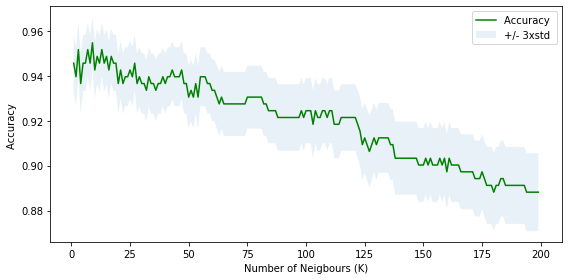

The best accuracy was with 0.9546827794561934 with k= 9 

Accuracy of kNN model:
Train set Accuracy:  0.966012084592145
Test set Accuracy:  0.9546827794561934
Jaccard index: 0.95
F1-score: 0.95
R2-score: 0.82


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)


In [ ]:

# Capturing the best k

Ks = 200
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n,metric = 'euclidean', n_jobs=-1).fit(X_train,np.ravel(y_train))
    yhat=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(np.ravel(y_test), yhat)

    
    #std_acc[n-1]=np.std(yhat==np.array(y_test))/np.sqrt(yhat.shape[0])
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])
#mean_acc

plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neigbours (K)')
plt.tight_layout()
plt.show()
print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1, "\n") 


#Train the best Model and Predict  

k_best = mean_acc.argmax()+1

neigh = KNeighborsClassifier(n_neighbors = k_best, metric = 'euclidean', n_jobs=-1).fit(X_train,y_train)
yhat=neigh.predict(X_test)
#print(yhat.shape)
print("Accuracy of kNN model:")
print("Train set Accuracy: ", metrics.accuracy_score(y_train, neigh.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat))
print("Jaccard index: %.2f" % jaccard_similarity_score(y_test, yhat))
print("F1-score: %.2f" % f1_score(y_test, yhat, average='weighted') )
print("R2-score: %.2f" % r2_score(yhat , y_test) )

Normalized confusion matrix
[[0.96 0.04]
 [0.05 0.95]]


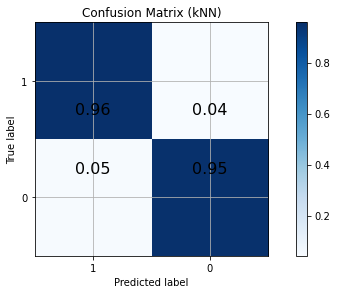

In [ ]:

# Compute confusion matrix
neigh = KNeighborsClassifier(n_neighbors = k_best, metric = 'euclidean', n_jobs=-1).fit(X_train,y_train)
yhat=neigh.predict(X_test)


names = [1,0] # For binary classification
#names = ['3', '2', '1'] # For multiclass

cnf_matrix = confusion_matrix(y_test, yhat, labels=names)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
#plt.figure()
plt.rcParams["figure.figsize"] = (8,4)
plt.rc('xtick',labelsize=10)
plt.rc('ytick',labelsize=10)

plot_confusion_matrix(cnf_matrix, inax=plt.gca(), classes=names,normalize= True,  title='Confusion Matrix (kNN)', cmap=plt.cm.Blues)


## Logistic Regression

Train set: (1092, 20) (1092,)
Test set: (563, 20) (563,)
Accuracy of LR model:
Train set Accuracy:  0.8223443223443223
Test set Accuracy:  0.8134991119005328
Jaccard index: 0.81
F1-score: 0.80
R2-score: 0.49
Normalized confusion matrix
[[0.4  0.55 0.05]
 [0.06 0.86 0.08]
 [0.   0.04 0.96]]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)


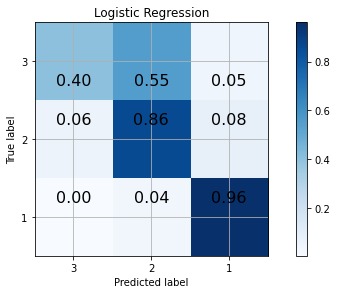

In [ ]:
# Logistic Regression Model

# Separating the sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, np.array(softmax_y), test_size=0.34, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score
LR = LogisticRegression(C=0.01, solver='lbfgs', multi_class='multinomial').fit(X_train,y_train)
yhat = LR.predict(X_test)
#yhat
yhat_prob = LR.predict_proba(X_test)
#yhat_prob

#
print("Accuracy of LR model:")
print("Train set Accuracy: ", metrics.accuracy_score(y_train, LR.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat))
print("Jaccard index: %.2f" % jaccard_similarity_score(y_test, yhat))
print("F1-score: %.2f" % f1_score(y_test, yhat, average='weighted') )
print("R2-score: %.2f" % r2_score(yhat , y_test) )



#names = [1,0] # For binary classification
names = ['3', '2', '1'] # For multiclass

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, yhat, labels=names)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.rcParams["figure.figsize"] = (8,4)
plot_confusion_matrix(cnf_matrix, inax=plt.gca(), classes=names,normalize= True,  title='Logistic Regression', cmap=plt.cm.Blues)
#plt.savefig('./Figs/Fig16_confusion_matrix_SVM.png', bbox_inches='tight')

## Support Vector Machine

Train set: (1108, 20) (1108,)
Test set: (547, 20) (547,)
Train set Accuracy:  0.8447653429602888
Test set Accuracy:  0.8336380255941499
Jaccard index: 0.83
F1-score: 0.83
R2-score: 0.61


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)


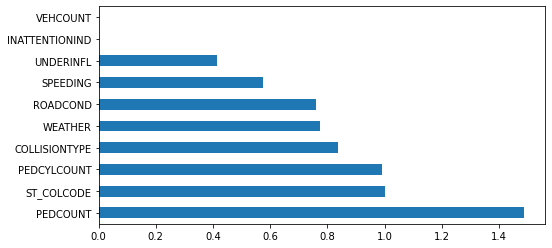

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( X, softmax_y, test_size=0.33, random_state=4)

print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

from sklearn import svm
clf = svm.SVC(kernel='linear')
clf.fit(X_train, y_train) 

yhat = clf.predict(X_test)
print("Train set Accuracy: ", metrics.accuracy_score(y_train, clf.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat))
print("Jaccard index: %.2f" % jaccard_similarity_score(y_test, yhat))
print("F1-score: %.2f" % f1_score(y_test, yhat, average='weighted') )
print("R2-score: %.2f" % r2_score(yhat , y_test) )

# Compute the ranked list of the features
pd.Series(abs(clf.coef_[0]), index=for_the_SVM.columns).nlargest(10).plot(kind='barh')

Normalized confusion matrix
[[0.48 0.49 0.03]
 [0.1  0.86 0.05]
 [0.   0.03 0.97]]


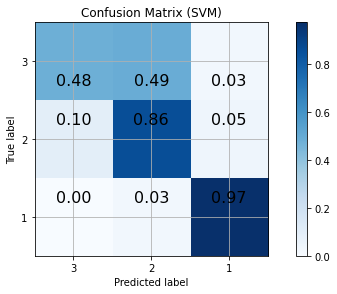

In [ ]:
#names = [1,0] # For binary classification
names = ['3', '2', '1'] # For multiclass

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, yhat, labels=names)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.rcParams["figure.figsize"] = (8,4)
plot_confusion_matrix(cnf_matrix, inax=plt.gca(), classes=names,normalize= True,  title='Confusion Matrix (SVM)', cmap=plt.cm.Blues)
#plt.savefig('./Figs/Fig16_confusion_matrix_SVM.png', bbox_inches='tight')


## **Decision Tree**




In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

X_trainset, X_testset, y_trainset, y_testset = train_test_split(X, np.array(softmax_y), test_size=0.5, random_state=3)

#X_trainset, X_testset, y_trainset, y_testset = X_train, X_test, y_train, y_test

DTree = DecisionTreeClassifier(criterion="entropy", max_depth = 4)
#drugTree # it shows the default parameters
DTree.fit(X_trainset,y_trainset)
yhat = DTree.predict(X_testset)
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_trainset, DTree.predict(X_trainset)))
print("Test set Accuracy: ", metrics.accuracy_score(y_testset, yhat))
print("Jaccard index: %.2f" % jaccard_similarity_score(y_testset, yhat))
print("F1-score: %.2f" % f1_score(y_testset, yhat, average='weighted') )
print("R2-score: %.2f" % r2_score(yhat , y_testset) )
#cnf_matrix = multilabel_confusion_matrix(y_test, yhat)


DecisionTrees's Accuracy:  0.8222490931076178
Test set Accuracy:  0.7946859903381642
Jaccard index: 0.79
F1-score: 0.76
R2-score: 0.26


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)


Normalized confusion matrix
[[0.22 0.7  0.08]
 [0.05 0.93 0.02]
 [0.01 0.04 0.95]]


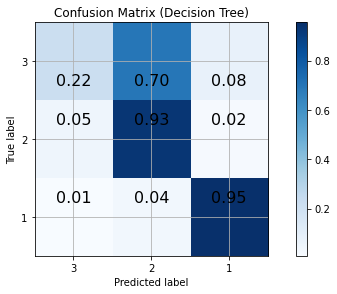

In [ ]:
#names = [1,0] # For binary classification
names = ['3', '2', '1'] # For multiclass

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_testset, yhat, labels=names)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.rcParams["figure.figsize"] = (8,4)
plot_confusion_matrix(cnf_matrix, inax=plt.gca(), classes=names,normalize= True,  title='Confusion Matrix (Decision Tree)', cmap=plt.cm.Blues)
#plt.savefig('./Figs/Fig16_confusion_matrix_SVM.png', bbox_inches='tight')

In [ ]:
df = pd.read_pickle('./drive/My Drive/processed_df.pkl')

df.groupby(["SEVERITYCODE"])["PEDCYLCOUNT"].value_counts()

SEVERITYCODE  PEDCYLCOUNT
0             0                8585
1             0              128821
              1                 678
2             0               51916
              1                4772
              2                  42
2b            0                2574
              1                 418
              2                   7
3             0                 304
              1                  26
              2                   1
Name: PEDCYLCOUNT, dtype: int64

In [ ]:
df.COLLISIONTYPE.unique()

array(['Angles', 'Rear Ended', 'Head On', 'Pedestrian', 'Other', 'Cycles',
       'Parked Car', 'Left Turn', 'Sideswipe', 'Right Turn'], dtype=object)

In [ ]:
df = pd.read_pickle('./drive/My Drive/processed_df.pkl')
df.head(5)

,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,EXCEPTRSNCODE,EXCEPTRSNDESC,SEVERITYCODE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDATE,INCDTTM,JUNCTIONTYPE,SDOT_COLCODE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR,year,month,day,hour,minute,weekday,day_name,NEIGHBOURHOOD
0,-122.356511,47.517361,1,327920,329420,3856094,Matched,Intersection,34911.0,17TH AVE SW AND SW ROXBURY ST,,NaN,1,Property Damage Only Collision,Angles,2,0,0,2,0,0,0,2020/01/19 00:00:00+00,2020-01-19 09:01:00,At Intersection (intersection related),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,0,Clear,Dry,Daylight,0,NaN,0,10,Entering at angle,0,0,0,2020,1,19,9,1,6,Sunday,South Delridge
1,-122.361405,47.702064,2,46200,46200,1791736,Matched,Block,NaN,HOLMAN RD NW BETWEEN 4TH AVE NW AND 3RD AVE NW,NaN,NaN,1,Property Damage Only Collision,Rear Ended,2,0,0,2,0,0,0,2005/04/11 00:00:00+00,2005-04-11 18:31:00,Mid-Block (not related to intersection),14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",1,0,Raining,Wet,Dusk,0,5101020.0,0,13,From same direction - both going straight - bo...,0,0,0,2005,4,11,18,31,0,Monday,Greenwood
2,-122.317414,47.664028,3,1212,1212,3507861,Matched,Block,NaN,ROOSEVELT WAY NE BETWEEN NE 47TH ST AND NE 50T...,,NaN,2,Injury Collision,Head On,2,0,0,2,1,0,0,2013/03/31 00:00:00+00,2013-03-31 02:09:00,Mid-Block (not related to intersection),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,0,Clear,Dry,Dark - Street Lights On,0,NaN,0,30,From opposite direction - all others,0,0,0,2013,3,31,2,9,6,Sunday,University District
3,-122.318234,47.619927,4,327909,329409,EA03026,Matched,Intersection,29054.0,11TH AVE E AND E JOHN ST,,NaN,2,Injury Collision,Pedestrian,3,1,0,1,1,0,0,2020/01/06 00:00:00+00,2020-01-06 17:55:00,At Intersection (intersection related),24.0,MOTOR VEHCILE STRUCK PEDESTRIAN,0,0,Raining,Wet,Dark - Street Lights On,0,NaN,0,0,Vehicle going straight hits pedestrian,0,0,0,2020,1,6,17,55,0,Monday,Broadway
4,-122.351724,47.560306,5,104900,104900,2671936,Matched,Block,NaN,WEST MARGINAL WAY SW BETWEEN SW ALASKA ST AND ...,NaN,NaN,2,Injury Collision,Other,2,0,0,1,1,0,0,2009/12/25 00:00:00+00,2009-12-25 19:00:00,Mid-Block (not related to intersection),28.0,MOTOR VEHICLE RAN OFF ROAD - HIT FIXED OBJECT,0,0,Clear,Ice,Dark - Street Lights On,0,9359012.0,1,50,Fixed object,0,0,0,2009,12,25,19,0,4,Friday,Industrial District
